**1. Using the walmart data, come up with useful insights that can be used by each of the stores to improve in various areas.**


2. Forecast the sales for each store for the next 12 weeks.


In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from google.colab import files

In [85]:
uploaded_file = files.upload()

Saving Walmart.csv to Walmart (1).csv


In [86]:
import os
import io

# Read the uploaded CSV file into a Pandas DataFrame
uploaded_file_name = list(uploaded_file.keys())[0]
df = pd.read_csv(io.BytesIO(uploaded_file[uploaded_file_name]))

In [87]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [88]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [89]:
store_nos=df['Store'].unique()
store_nos

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45])

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [91]:
df['Date'] = pd.to_datetime(df['Date'])

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [93]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106


If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

In [94]:
correlation_results = []
for store_number in df['Store'].unique():
    store_data = df[df['Store']==store_number]
    corr_data = store_data['Weekly_Sales'].corr(store_data['Unemployment'])
    corr_df = print(f"Store {store_number}: Correlation = {corr_data}")

Store 1: Correlation = -0.0979553947295795
Store 2: Correlation = 0.06632485967770846
Store 3: Correlation = -0.2304130134863526
Store 4: Correlation = -0.3370151956445587
Store 5: Correlation = -0.20704271031605842
Store 6: Correlation = 0.044250821015624046
Store 7: Correlation = -0.16538168270129636
Store 8: Correlation = -0.05257964619712677
Store 9: Correlation = -0.1915343637022839
Store 10: Correlation = 0.13190762207746096
Store 11: Correlation = -0.020338971133082306
Store 12: Correlation = -0.009286099902746538
Store 13: Correlation = -0.1716328688963503
Store 14: Correlation = 0.2107864829459358
Store 15: Correlation = 0.0789053686051426
Store 16: Correlation = -0.07086358405192238
Store 17: Correlation = -0.26359968183073906
Store 18: Correlation = 0.13917900226669452
Store 19: Correlation = 0.10146392090273439
Store 20: Correlation = -0.09534134450284637
Store 21: Correlation = 0.21836733305703376
Store 22: Correlation = 0.039042867355347455
Store 23: Correlation = -0.0771

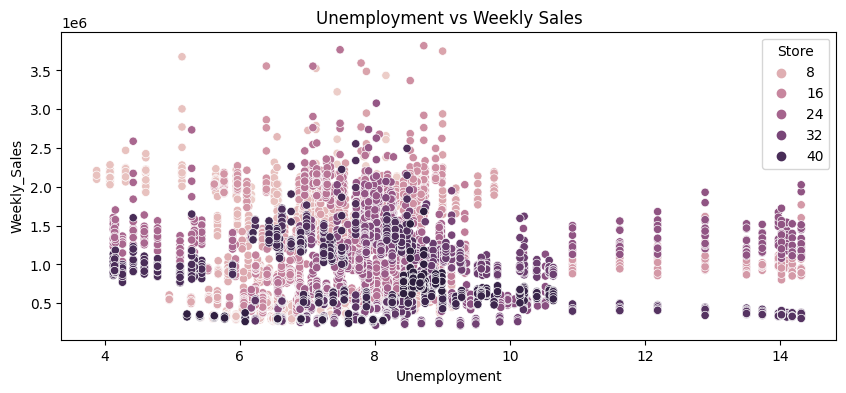

In [95]:
plt.figure(figsize=(10,4))
sns.scatterplot(data=df,x='Unemployment',y='Weekly_Sales',hue='Store')
plt.title("Unemployment vs Weekly Sales")
plt.xlabel('Unemployment')
plt.ylabel('Weekly_Sales')
plt.show()

Weekly sales are effected by unemployment, and mostly the stores 32 and 40

**If the weekly sales show a seasonal trend, when and what could be the reason?**

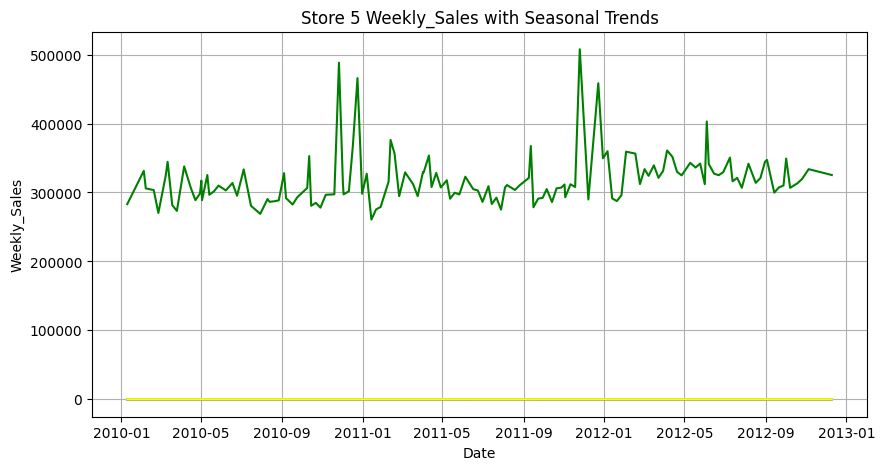

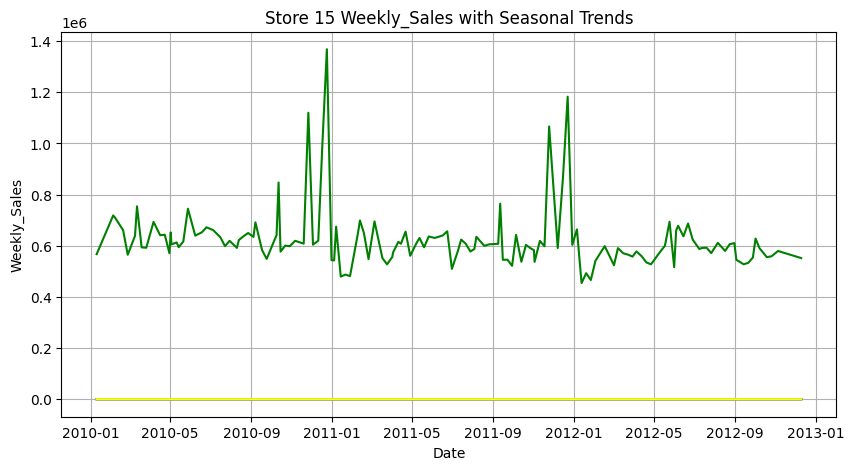

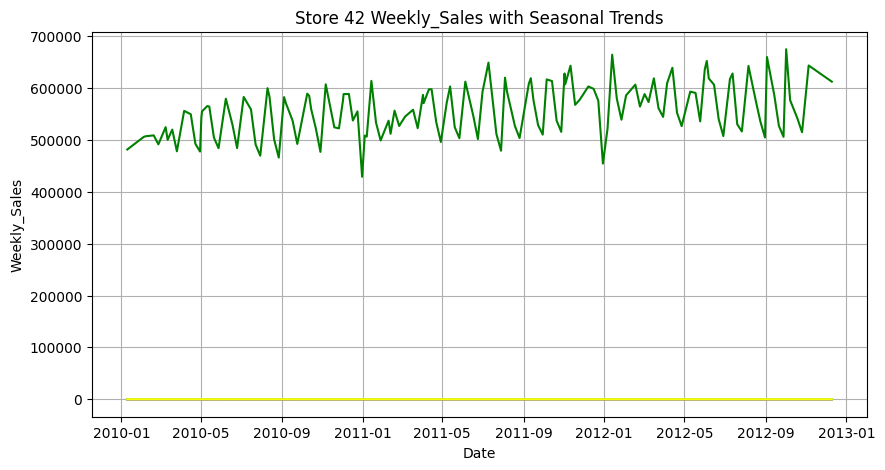

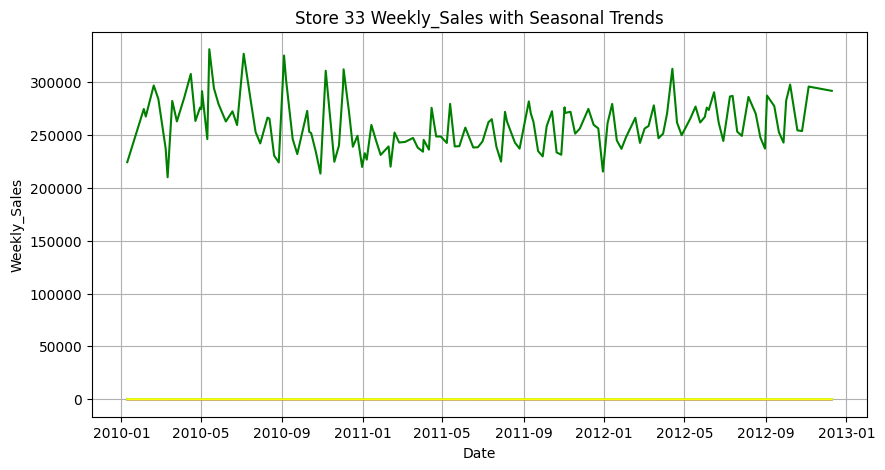

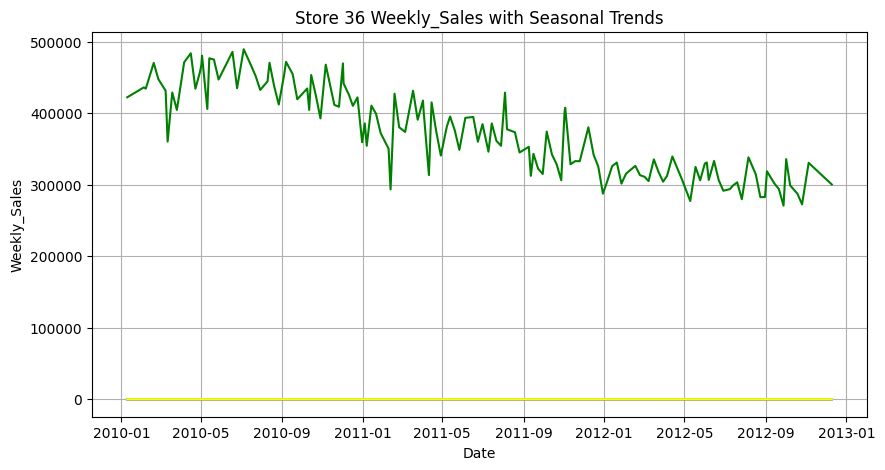

...

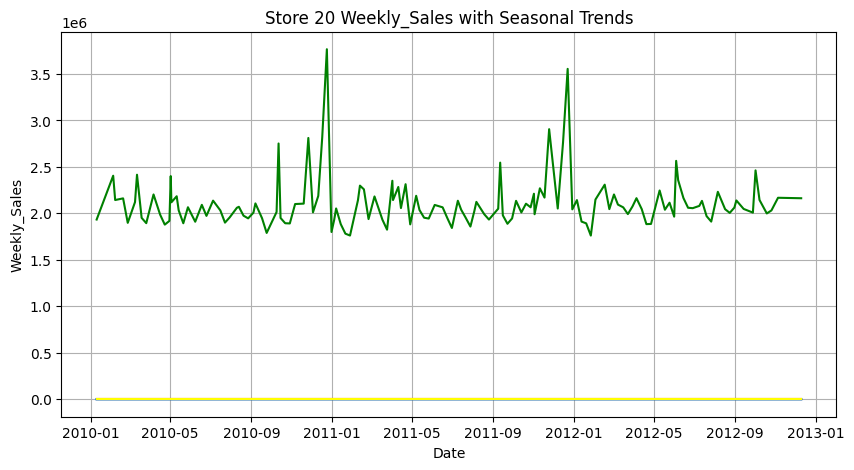

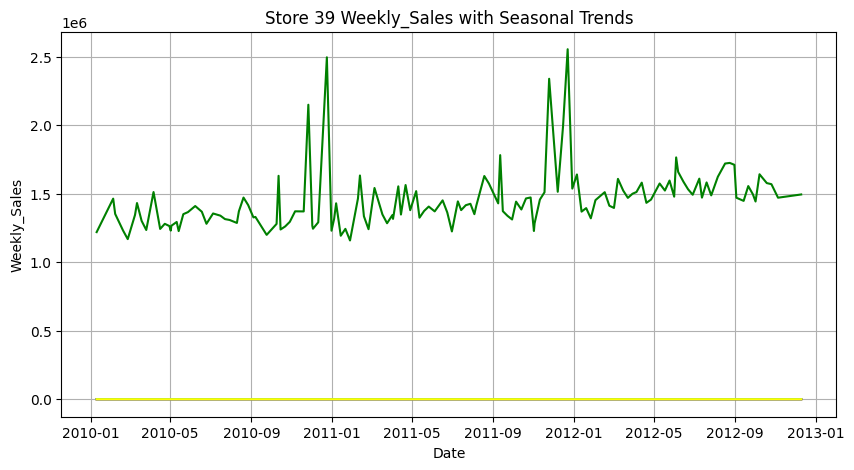

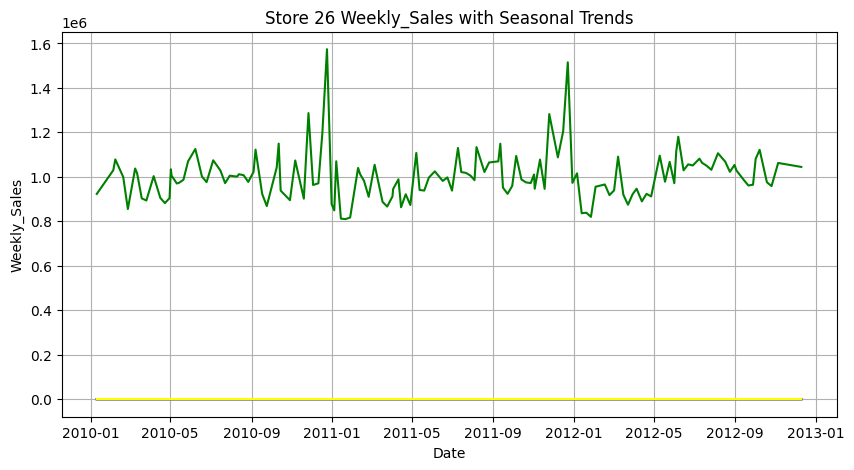

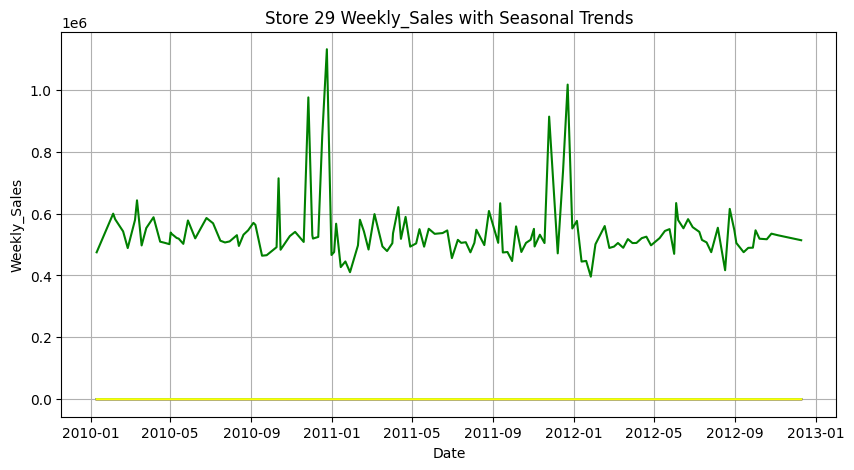

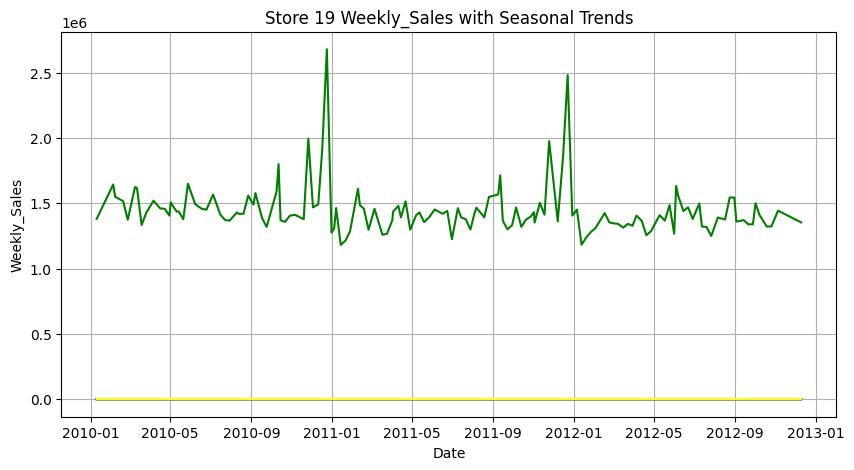

In [96]:
df = df.sort_values(by='Date')

for store in df['Store'].unique():
    store_data = df[df['Store'] == store]

    # Setting 'Date' as the index
    store_data.set_index('Date', inplace=True)

    # Plot the weekly sales data for each store to identify seasonal trends
    plt.figure(figsize=(10, 5))
    plt.plot(store_data['Weekly_Sales'], label=f'Store {store} Weekly_Sales', color='green')
    plt.plot(store_data['Holiday_Flag'], color='red')
    plt.plot(store_data['Temperature'], color='blue')
    plt.plot(store_data['Fuel_Price'], color='Orange')
    plt.plot(store_data['CPI'], color='c')
    plt.plot(store_data['Unemployment'], color='yellow')

    plt.title(f'Store {store} Weekly_Sales with Seasonal Trends')
    plt.xlabel('Date')
    plt.ylabel('Weekly_Sales')
    plt.grid(True)

**Weekly seasonal sales are high duing holiday season**

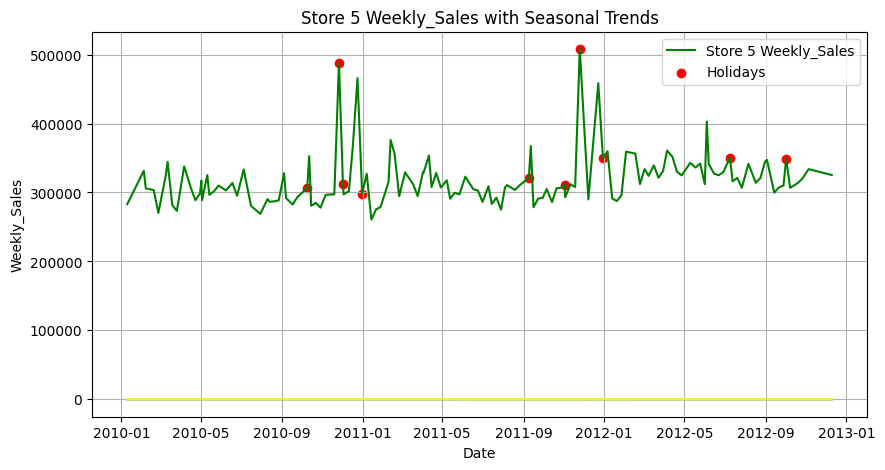

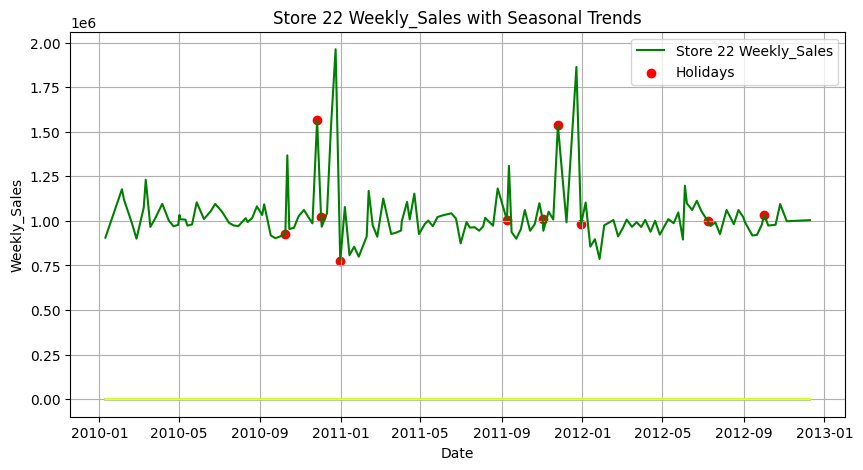

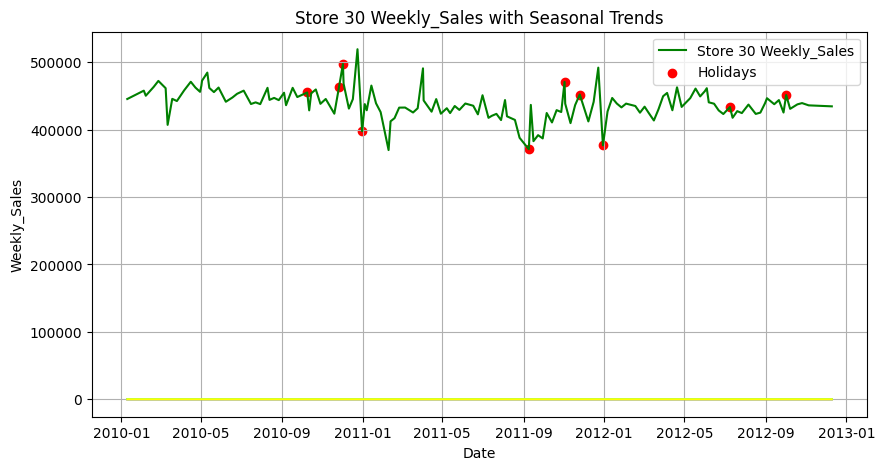

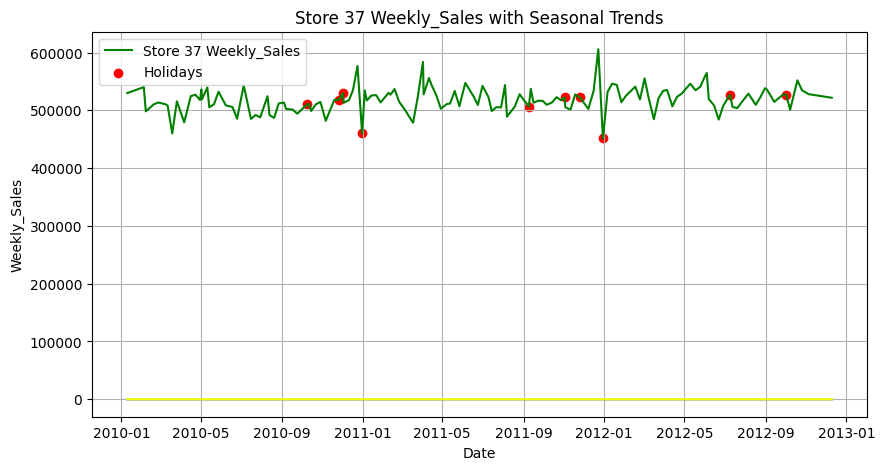

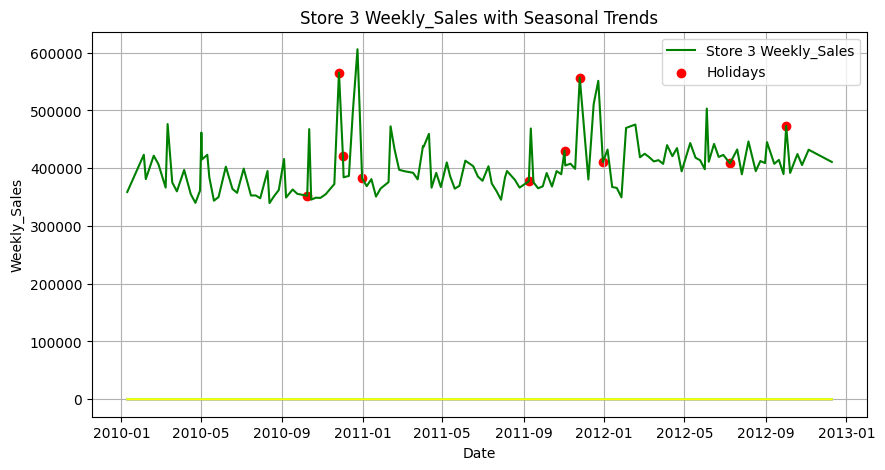

...

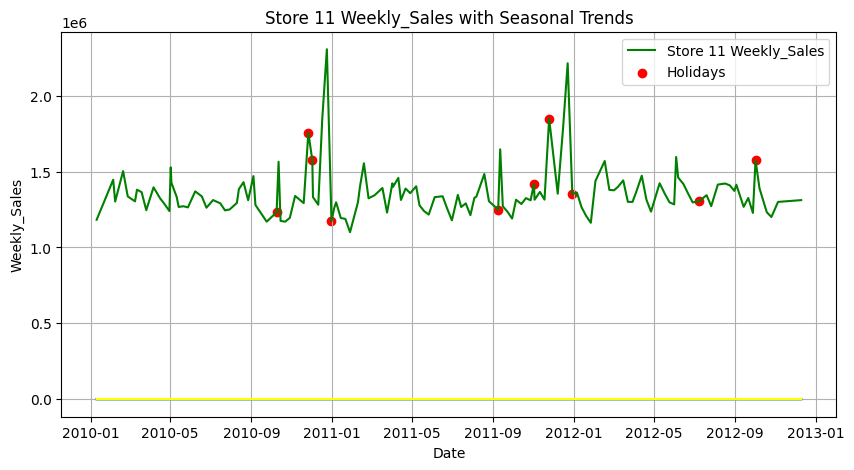

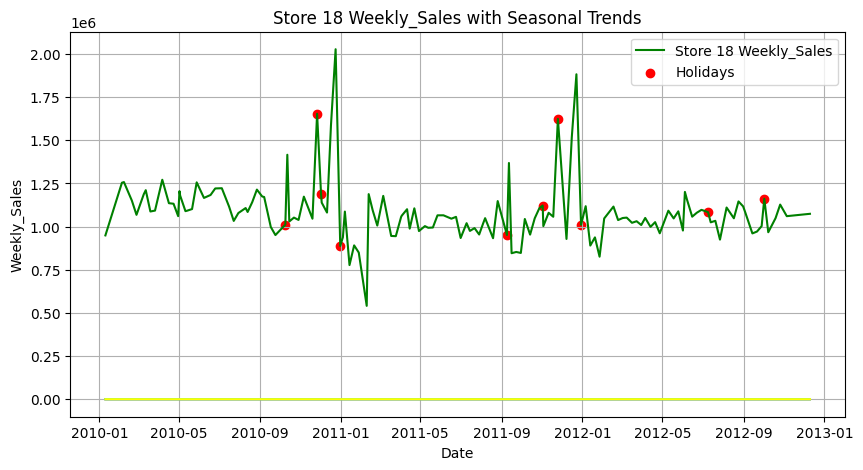

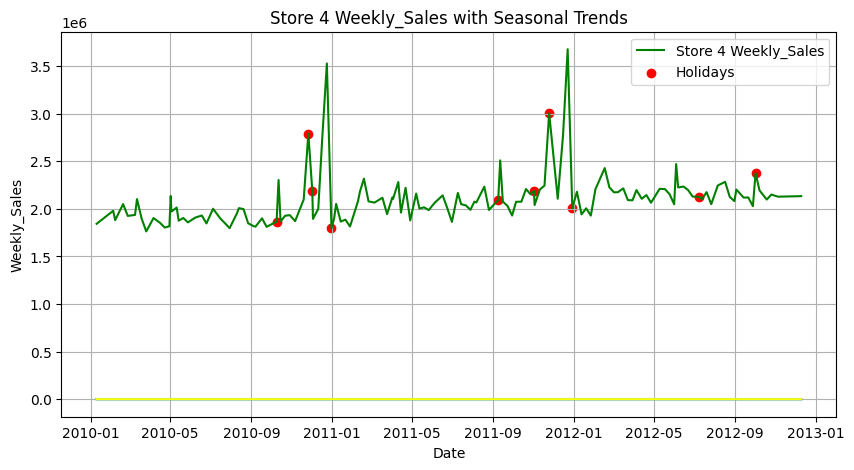

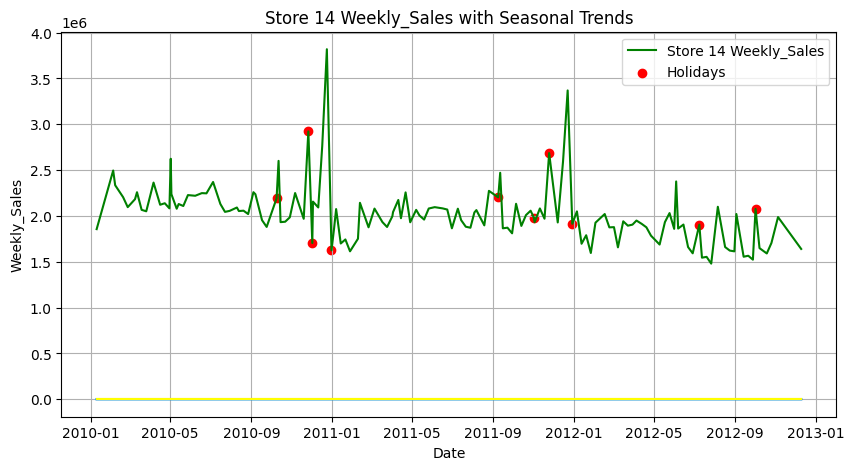

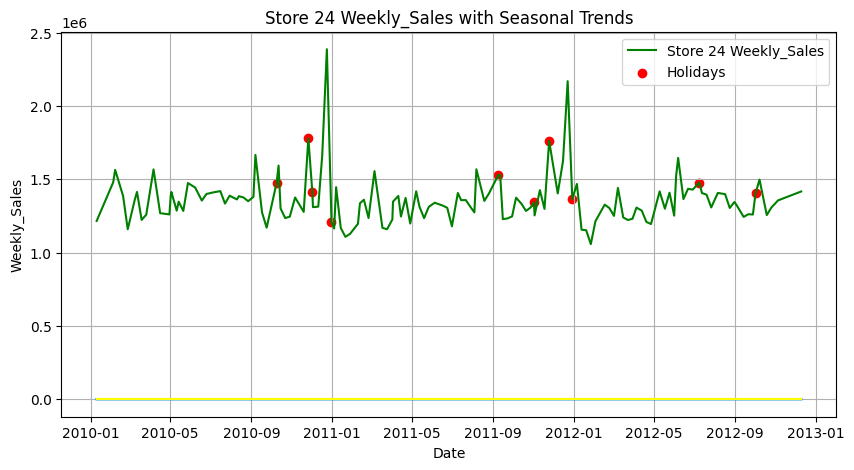

In [97]:
df = df.sort_values(by='Date')

for store in df['Store'].unique():
    store_data = df[df['Store'] == store]

    # Setting 'Date' as the index
    store_data.set_index('Date', inplace=True)

    # Plot the weekly sales data for each store to identify seasonal trends
    plt.figure(figsize=(10, 5))
    plt.plot(store_data['Weekly_Sales'], label=f'Store {store} Weekly_Sales', color='green')
    holiday_dates = store_data[store_data['Holiday_Flag'] == 1].index
    plt.scatter(holiday_dates, store_data.loc[holiday_dates, 'Weekly_Sales'], color='red', label='Holidays')

    plt.plot(store_data['Temperature'], color='blue')
    plt.plot(store_data['Fuel_Price'], color='orange')
    plt.plot(store_data['CPI'], color='cyan')
    plt.plot(store_data['Unemployment'], color='yellow')

    plt.title(f'Store {store} Weekly_Sales with Seasonal Trends')
    plt.xlabel('Date')
    plt.ylabel('Weekly_Sales')
    plt.legend()
    plt.grid(True)
    plt.show()

**Does temperature affect the weekly sales in any manner**

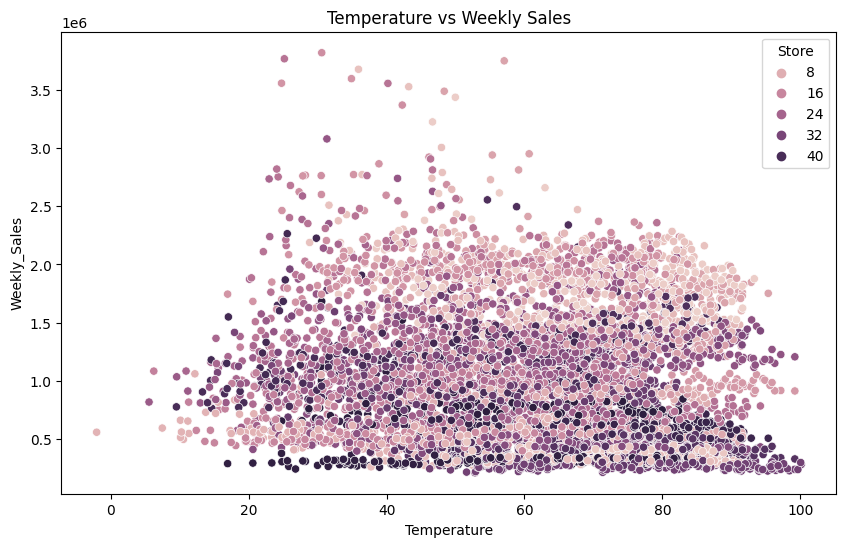

In [98]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df,x='Temperature',y='Weekly_Sales',hue='Store')
plt.title("Temperature vs Weekly Sales")
plt.xlabel('Temperature')
plt.ylabel('Weekly_Sales')
plt.show()

**Weekly sales are low during summer and winter season**

**Top performing stores according to the historical data**

In [99]:
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()
store_sales['Rank'] = store_sales['Weekly_Sales'].rank(ascending=False)
top_performing_stores = store_sales.sort_values(by='Rank')
print(top_performing_stores)

    Store  Weekly_Sales  Rank
19     20  3.013978e+08   1.0
3       4  2.995440e+08   2.0
13     14  2.889999e+08   3.0
12     13  2.865177e+08   4.0
1       2  2.753824e+08   5.0
9      10  2.716177e+08   6.0
26     27  2.538559e+08   7.0
5       6  2.237561e+08   8.0
0       1  2.224028e+08   9.0
38     39  2.074455e+08  10.0
18     19  2.066349e+08  11.0
30     31  1.996139e+08  12.0
22     23  1.987506e+08  13.0
23     24  1.940160e+08  14.0
10     11  1.939628e+08  15.0
27     28  1.892637e+08  16.0
40     41  1.813419e+08  17.0
31     32  1.668192e+08  18.0
17     18  1.551147e+08  19.0
21     22  1.470756e+08  20.0
11     12  1.442872e+08  21.0
25     26  1.434164e+08  22.0
33     34  1.382498e+08  23.0
39     40  1.378703e+08  24.0
34     35  1.315207e+08  25.0
7       8  1.299512e+08  26.0
16     17  1.277821e+08  27.0
44     45  1.123953e+08  28.0
20     21  1.081179e+08  29.0
24     25  1.010612e+08  30.0
42     43  9.056544e+07  31.0
14     15  8.913368e+07  32.0
6       7 

In [100]:
sales = df.groupby(by='Store')["Weekly_Sales"].sum().sort_values(ascending=False).reset_index()

[Text(0.5, 0, 'Store'), Text(0, 0.5, 'Total Sales')]

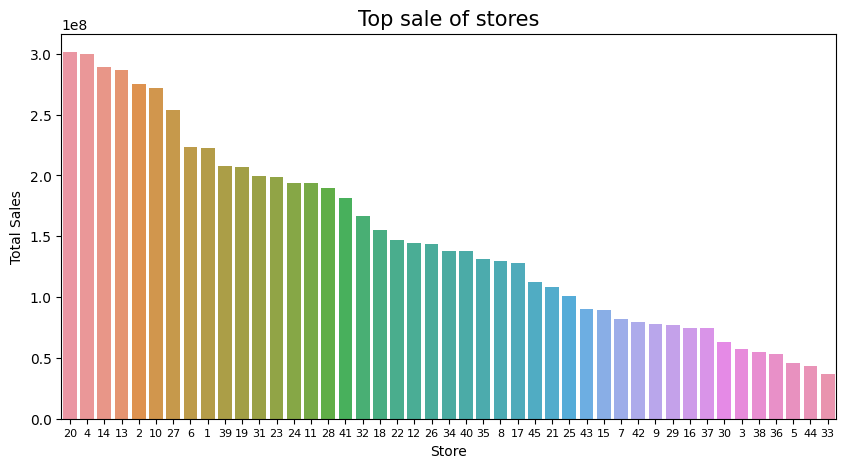

In [101]:
plt.figure(figsize=(10,5))
plt.xticks(fontsize=8)
plt.yticks(fontsize=10)
plt.xlabel("Total sales",fontsize=10)
plt.ylabel("Store",fontsize=10)
plt.title("Top sale of stores",fontsize=15)
ax = sns.barplot(x=sales.Store.astype(str), y=sales.Weekly_Sales)
ax.set(xlabel="Store",ylabel="Total Sales")

In [102]:
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()
worst_store = store_sales.loc[store_sales['Weekly_Sales'].idxmin()]

best_store = store_sales.loc[store_sales['Weekly_Sales'].idxmax()]

sales_difference = best_store['Weekly_Sales'] - worst_store['Weekly_Sales']

sales_std_dev = store_sales['Weekly_Sales'].std()
significance = sales_difference / sales_std_dev

print("Worst Performing Store:")
print(worst_store)

print("\nBest Performing Store:")
print(best_store)

print("\nDifference in Sales (Best - Worst):", sales_difference)
print("Significance of Difference (in Std Devs):", significance)

Worst Performing Store:
Store                 33.00
Weekly_Sales    37160221.96
Name: 32, dtype: float64

Best Performing Store:
Store           2.000000e+01
Weekly_Sales    3.013978e+08
Name: 19, dtype: float64

Difference in Sales (Best - Worst): 264237570.49999997
Significance of Difference (in Std Devs): 3.380399520680757


**Store number 20 has the highest sales and store number 33 has the lowest sales**

**Forecast the sales for each store for the next 12 weeks**

In [103]:
# Setting Date column as Index
df.set_index('Date',inplace = True)

In [104]:
# Testing for stationarity

from statsmodels.tsa.stattools import adfuller
#ADF Test

#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(Weekly_Sales):
    result=adfuller(Weekly_Sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [105]:
adfuller_test(df['Weekly_Sales'])

ADF Test Statistic : -14.055502740328153
p-value : 3.1225679446322235e-26
#Lags Used : 20
Number of Observations Used : 6414
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


Time series is stationary.


<Axes: xlabel='Date'>

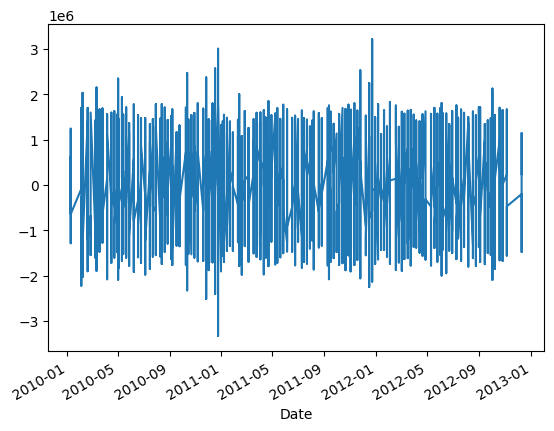

In [106]:
df['Weekly_Sales_Diff'] = df['Weekly_Sales'] - df['Weekly_Sales'].shift(1)
result = adfuller(df['Weekly_Sales_Diff'].dropna())
if result[1] <= 0.05:
    print("Time series is stationary.")
else:
    print("Time series is not stationary. You may need to difference again or apply other transformations.")
df['Weekly_Sales_Diff'].plot()

In [107]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [108]:
df = df.iloc[:, :2]
df.head()

,Store,Weekly_Sales
Date,,
2010-01-10,5,283178.12
2010-01-10,22,905987.17
2010-01-10,30,445475.30
2010-01-10,37,529877.93
2010-01-10,3,358784.10


In [109]:
sales_data =  df[df['Store'] == 1]
sales_data.drop(columns='Store', inplace = True)

In [110]:
sales_data.head()

,Weekly_Sales
Date,
2010-01-10,1453329.50
2010-02-04,1594968.28
2010-02-07,1492418.14
2010-02-19,1611968.17
2010-02-26,1409727.59


Time series is stationary.


<Axes: xlabel='Date'>

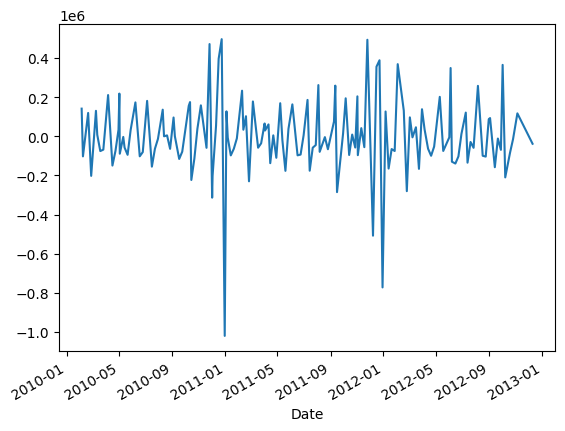

In [111]:
sales_data['Weekly_Sales_Diff'] = sales_data['Weekly_Sales'] - sales_data['Weekly_Sales'].shift(1)
result = adfuller(sales_data['Weekly_Sales_Diff'].dropna())
if result[1] <= 0.05:
    print("Time series is stationary.")
else:
    print("Time series is not stationary. You may need to difference again or apply other transformations.")
sales_data['Weekly_Sales_Diff'].plot()

In [112]:
sales_data.isna().sum()

Weekly_Sales         0
Weekly_Sales_Diff    1
dtype: int64

In [113]:
sales_data.dropna(inplace=True)

In [114]:
sales_data.head()

,Weekly_Sales,Weekly_Sales_Diff
Date,,
2010-02-04,1594968.28,141638.78
2010-02-07,1492418.14,-102550.14
2010-02-19,1611968.17,119550.03
2010-02-26,1409727.59,-202240.58
2010-03-09,1540163.53,130435.94


In [115]:
sales_data.drop(columns = 'Weekly_Sales',inplace = True)

In [116]:
sales_data.head()

,Weekly_Sales_Diff
Date,
2010-02-04,141638.78
2010-02-07,-102550.14
2010-02-19,119550.03
2010-02-26,-202240.58
2010-03-09,130435.94


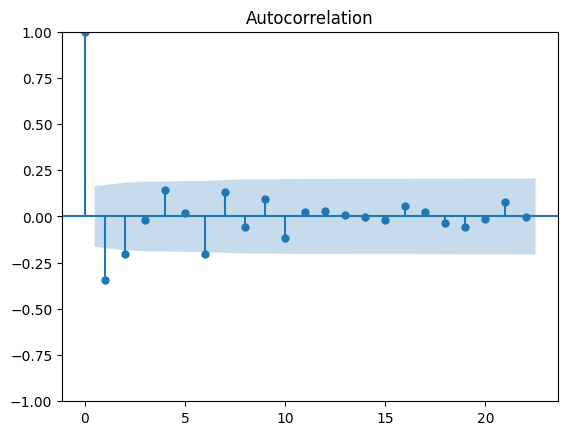

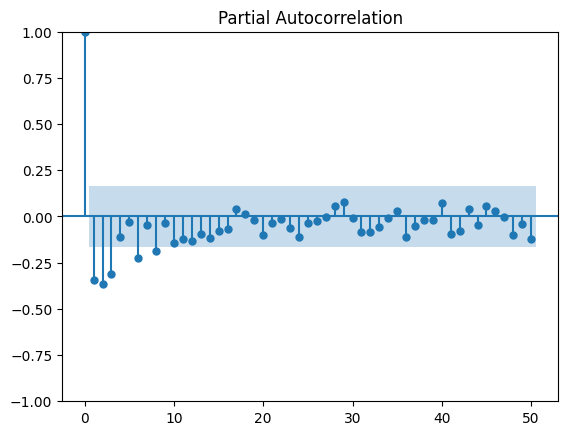

In [117]:
plot_acf(sales_data);
plot_pacf(sales_data,lags=50);

In [118]:
sales_data.reset_index(inplace = True)

In [26]:
# !pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.5 MB/s eta 0:00:00


In [119]:
from pmdarima import auto_arima
order = auto_arima(sales_data['Weekly_Sales_Diff'])
order.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  142
Model:               SARIMAX(0, 0, 2)   Log Likelihood               -1898.475
Date:                Thu, 11 Jan 2024   AIC                           3802.950
Time:                        15:44:50   BIC                           3811.817
Sample:                             0   HQIC                          3806.553
                                - 142                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7498      0.056    -13.446      0.000      -0.859      -0.640
ma.L2         -0.2099      0.078     -2.706      0.007      -0.362      -0.058
sigma2      2.808e+10   1.76e-12   1.59e+22      0.000    2.81e+10    2.81e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):               313.32
Prob(Q):                              0.76   Prob(JB):                         0.00
Heteroskedasticity (H):               0.82   Skew:                             1.89
Prob(H) (two-sided):                  0.50   Kurtosis:                         9.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.91e+37. Standard errors may be unstable.
"""

In [120]:
train  = sales_data.iloc[:120]
test  = sales_data.iloc[120:]

In [121]:
train

,Date,Weekly_Sales_Diff
0,2010-02-04,141638.78
1,2010-02-07,-102550.14
2,2010-02-19,119550.03
3,2010-02-26,-202240.58
4,2010-03-09,130435.94
...,...,...
115,2012-05-10,201857.60
116,2012-05-18,-74884.10
117,2012-05-25,-40457.32
118,2012-06-01,-5074.63


In [122]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model=sm.tsa.statespace.SARIMAX(sales_data['Weekly_Sales_Diff'],order=(0,0,2))
results =model.fit()

In [124]:
sales_data.head()

,Date,Weekly_Sales_Diff
0,2010-02-04,141638.78
1,2010-02-07,-102550.14
2,2010-02-19,119550.03
3,2010-02-26,-202240.58
4,2010-03-09,130435.94


In [125]:
sales_data['forecast'] = results.predict(start=len(train), end=len(train)+len(test)-1).reset_index(drop=True)
sales_data

,Date,Weekly_Sales_Diff,forecast
0,2010-02-04,141638.78,-237630.142154
1,2010-02-07,-102550.14,-148914.549571
2,2010-02-19,119550.03,-29881.369996
3,2010-02-26,-202240.58,52613.335717
4,2010-03-09,130435.94,45319.390973
...,...,...,...
137,2012-10-08,-210067.46,NaN
138,2012-10-19,-84341.20,NaN
139,2012-10-26,-14409.03,NaN
140,2012-11-05,117436.31,NaN


In [126]:
sales_data.isna().sum()

Date                   0
Weekly_Sales_Diff      0
forecast             120
dtype: int64

In [127]:
sales_data.set_index('Date',inplace = True)

In [128]:
sales_data

,Weekly_Sales_Diff,forecast
Date,,
2010-02-04,141638.78,-237630.142154
2010-02-07,-102550.14,-148914.549571
2010-02-19,119550.03,-29881.369996
2010-02-26,-202240.58,52613.335717
2010-03-09,130435.94,45319.390973
...,...,...
2012-10-08,-210067.46,NaN
2012-10-19,-84341.20,NaN
2012-10-26,-14409.03,NaN


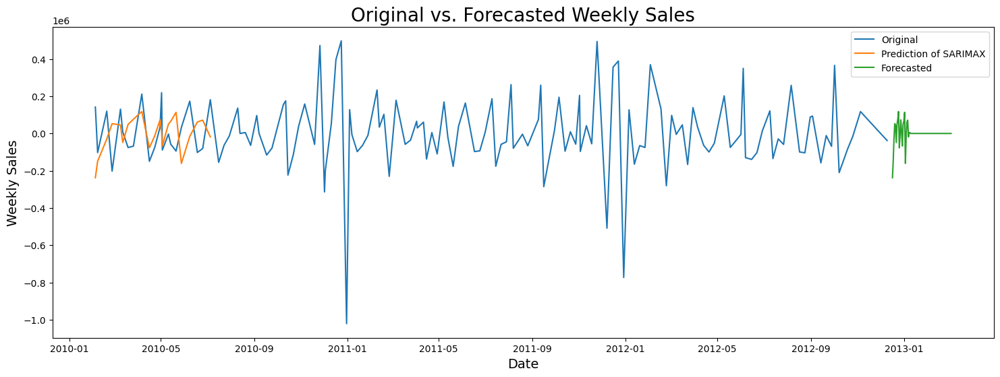

            Weekly_Sales_Diff_Forecast
Date                                  
2012-12-17              -237630.142154
2012-12-18              -148914.549571
2012-12-19               -29881.369996
2012-12-20                52613.335717
2012-12-21                45319.390973
...                                ...
2013-02-28                    0.000000
2013-03-01                    0.000000
2013-03-02                    0.000000
2013-03-03                    0.000000
2013-03-04                    0.000000

[78 rows x 1 columns]


In [129]:
# Create a date range for the next 12 weeks
sales_data.index = pd.to_datetime(sales_data.index)
forecast_start_date = sales_data.index[-1] + pd.DateOffset(weeks=1)  # Start from the next week
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=11)   # Forecast for 12 weeks

forecast_date_range = pd.date_range(forecast_start_date, forecast_end_date)

# Forecast the next 12 weeks
forecast = results.predict(start=len(train), end=len(train) + len(forecast_date_range) - 1)

# Create a DataFrame for the forecasted data with the appropriate date index
forecast_df = pd.DataFrame({'Date': forecast_date_range, 'Weekly_Sales_Diff_Forecast': forecast})
forecast_df.set_index('Date', inplace=True)

# Plot the original and forecasted data
plt.figure(figsize=(18, 6))
plt.title('Original vs. Forecasted Weekly Sales', fontsize=20)
plt.plot(sales_data['Weekly_Sales_Diff'], label='Original')
plt.plot(sales_data.forecast, label='Prediction of SARIMAX')
plt.plot(forecast_df['Weekly_Sales_Diff_Forecast'], label='Forecasted')
plt.legend(loc='best')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Weekly Sales', fontsize=14)
plt.show()

# Print the forecasted data with date index
print(forecast_df)

In [77]:
# sales_data.reset_index(inplace = True)
sales_data

,Weekly_Sales_Diff,forecast
Date,,
2010-12-02,-1733.46,28636.473792
2010-02-19,-29989.27,-20126.278481
2010-02-26,-202240.58,-69874.129257
2010-05-03,145079.09,-21433.650195
2010-12-03,-115265.09,50461.711748
...,...,...
2012-09-28,-69066.80,NaN
2012-05-10,233726.71,NaN
2012-12-10,-97713.16,NaN


Store 1: Time series is stationary.


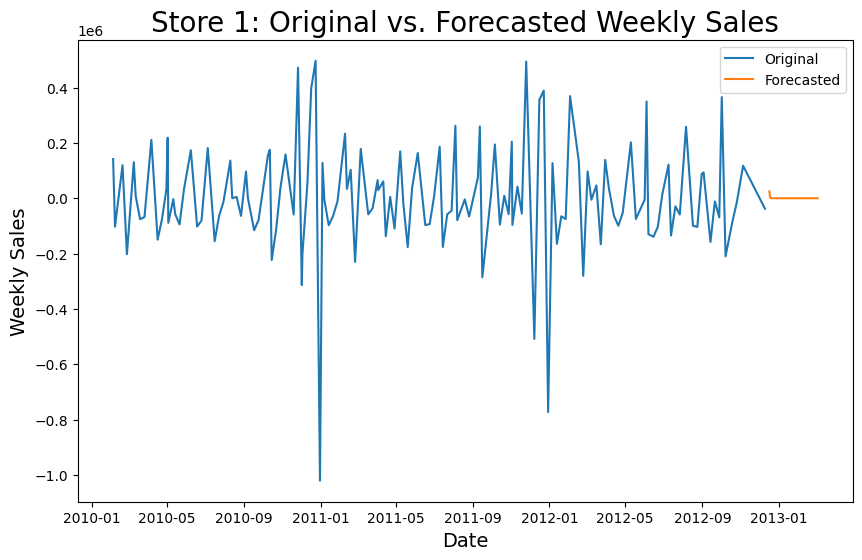

Store 2: Time series is stationary.


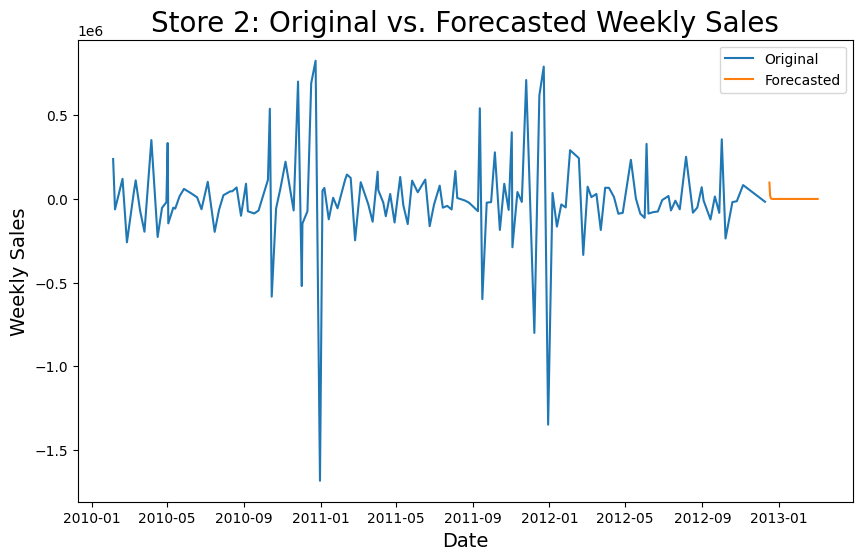

Store 3: Time series is stationary.


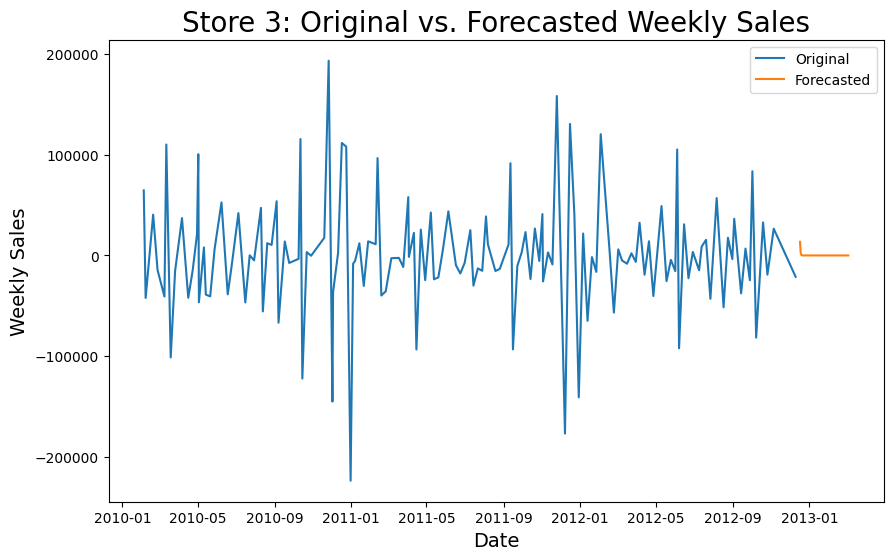

Store 4: Time series is stationary.


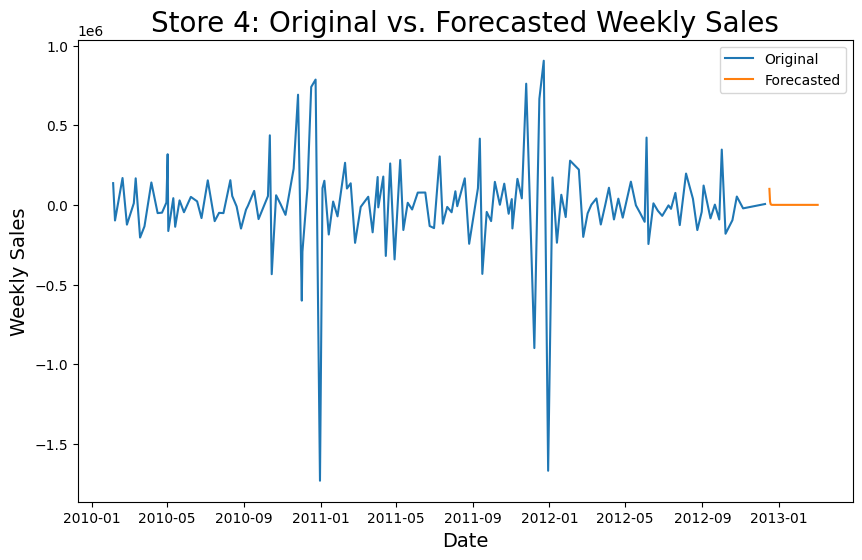

Store 5: Time series is stationary.


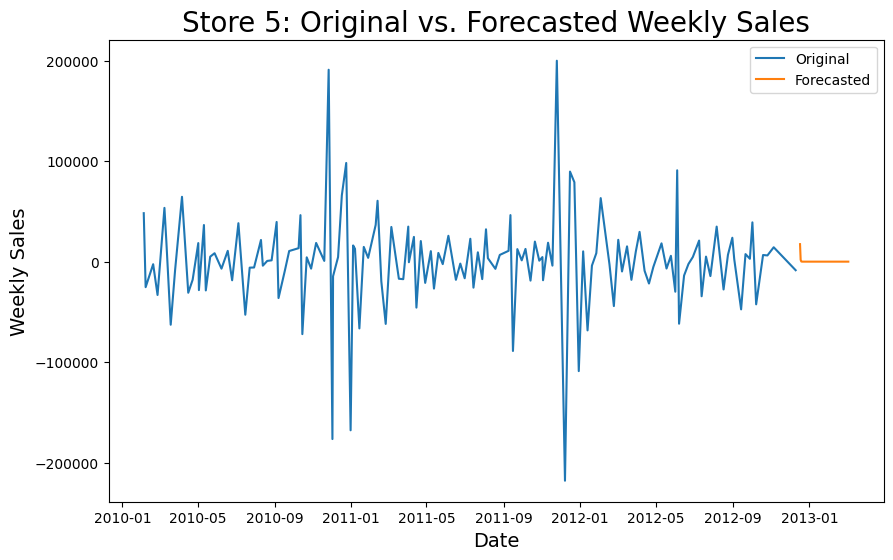

Store 6: Time series is stationary.


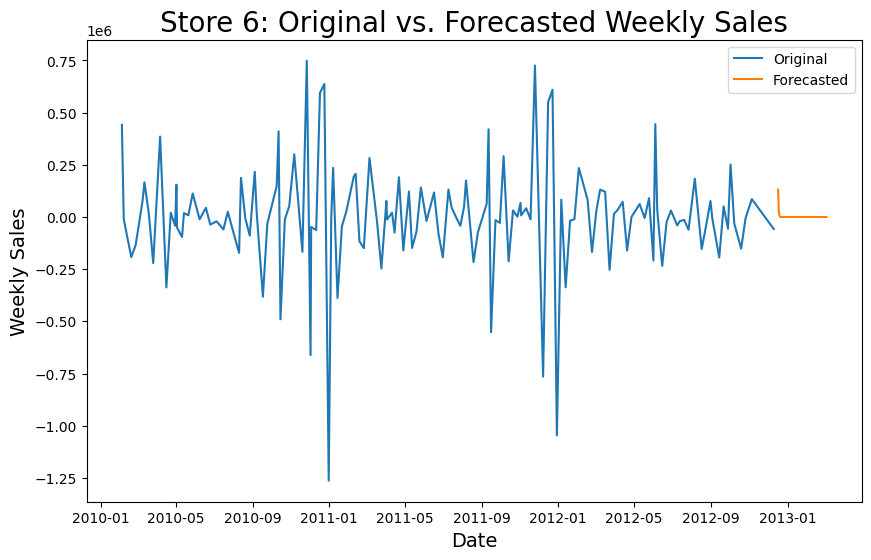

Store 7: Time series is stationary.


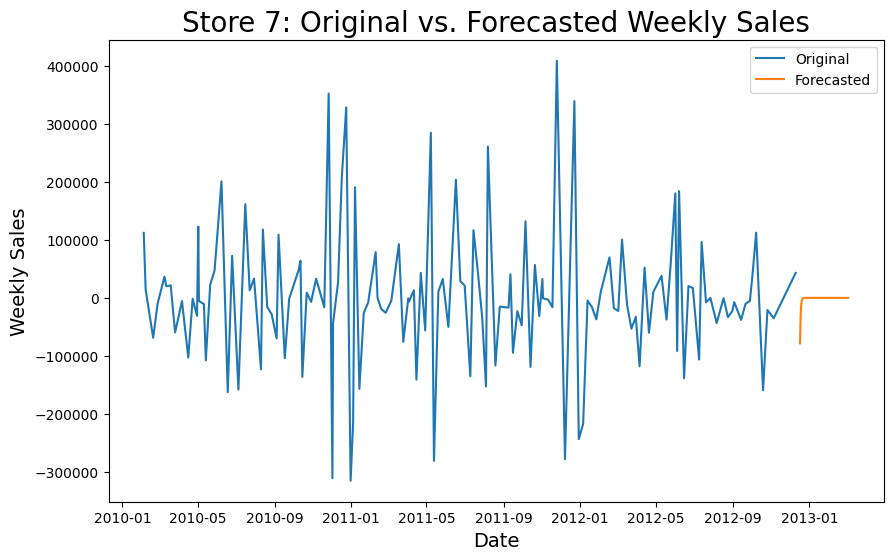

Store 8: Time series is stationary.


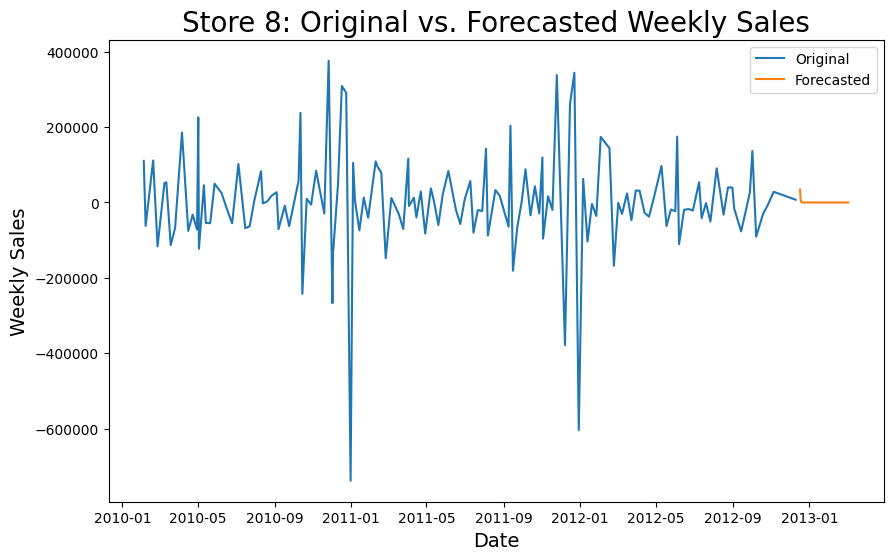

Store 9: Time series is stationary.


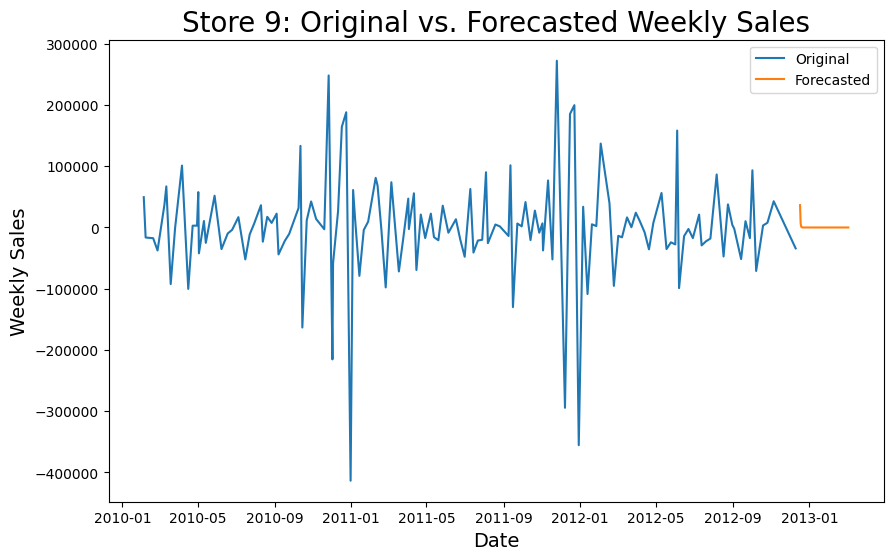

Store 10: Time series is stationary.


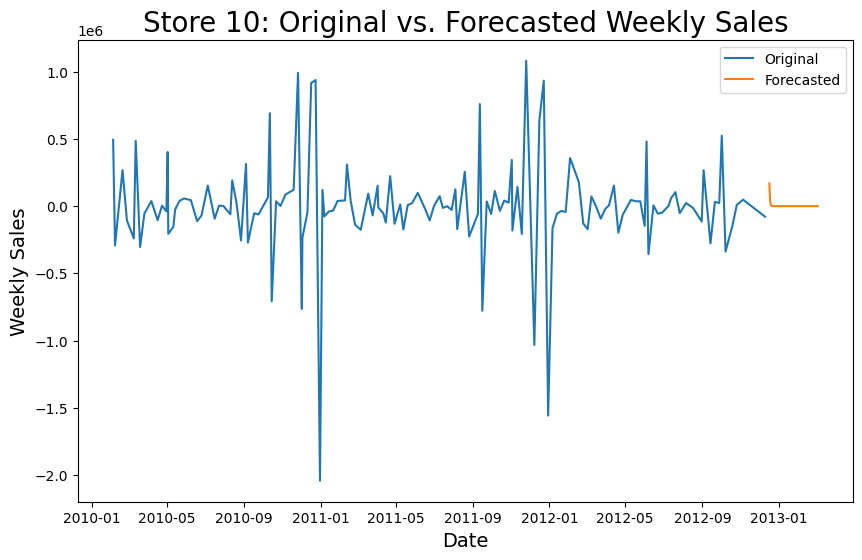

Store 11: Time series is stationary.


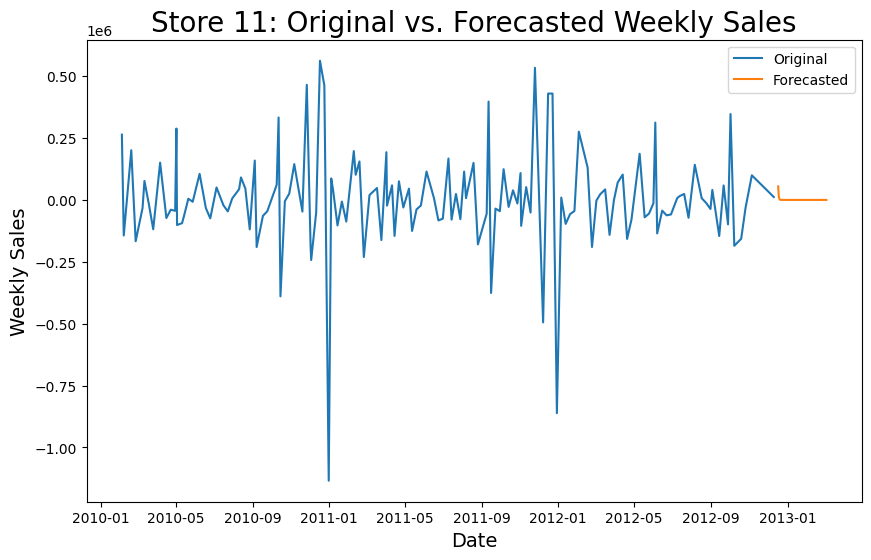

Store 12: Time series is stationary.


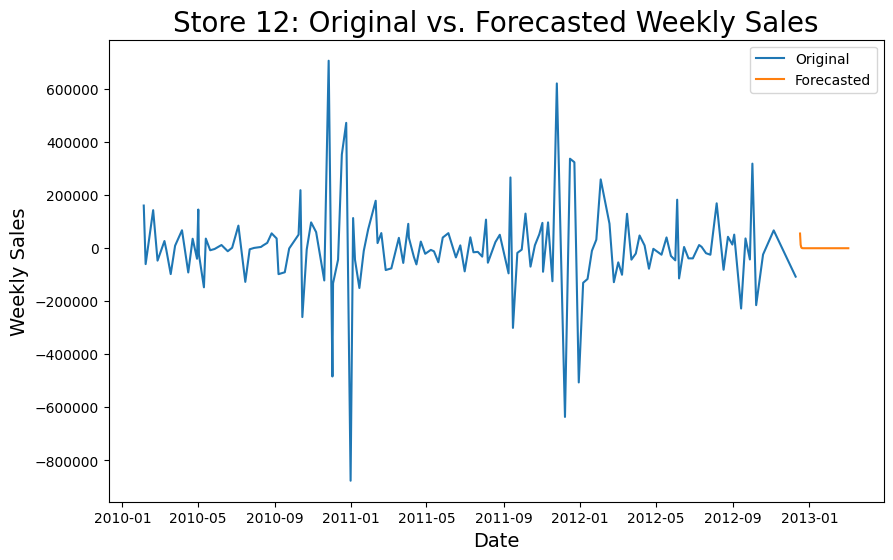

Store 13: Time series is stationary.


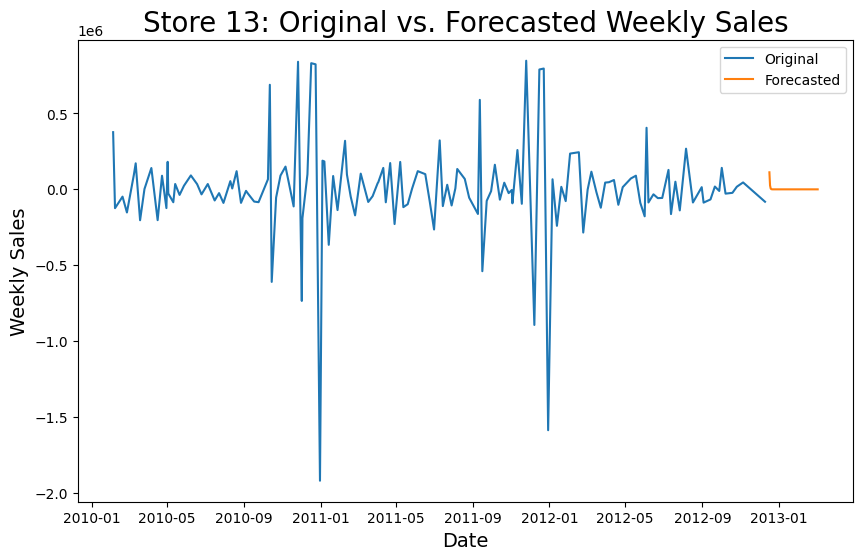

Store 14: Time series is stationary.


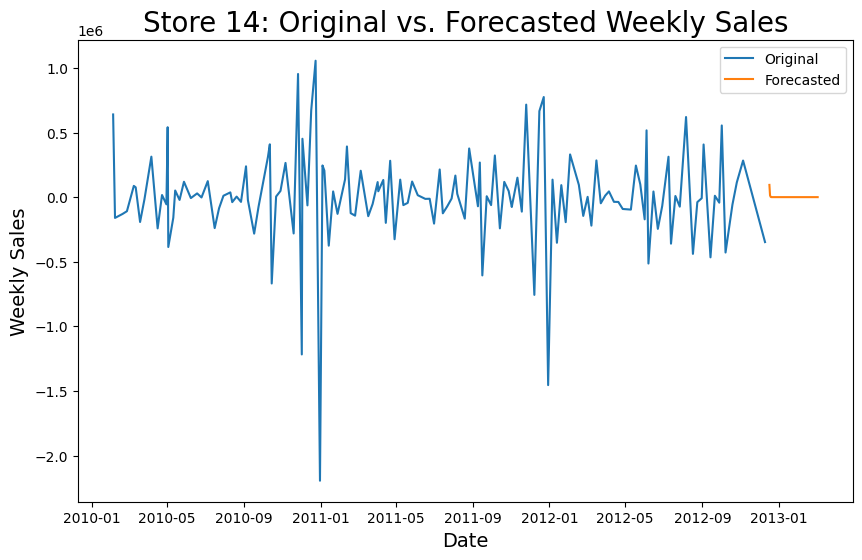

Store 15: Time series is stationary.


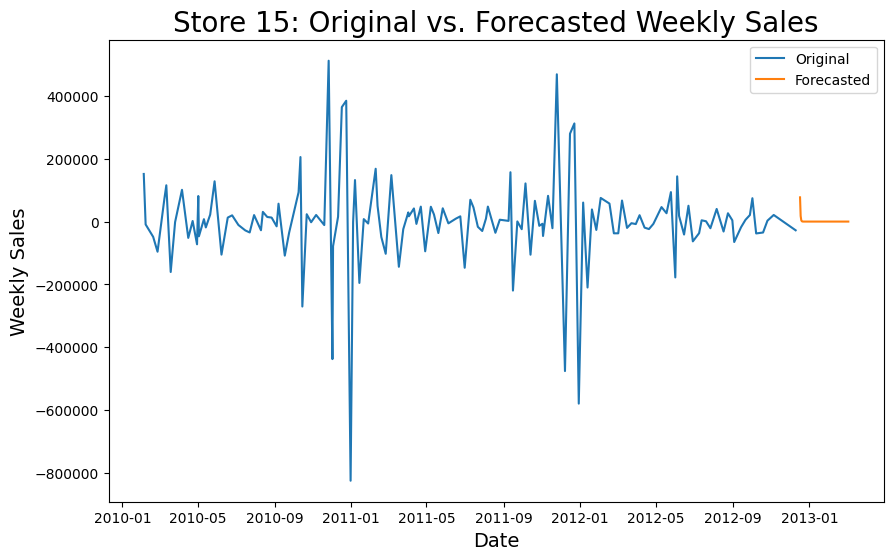

Store 16: Time series is stationary.


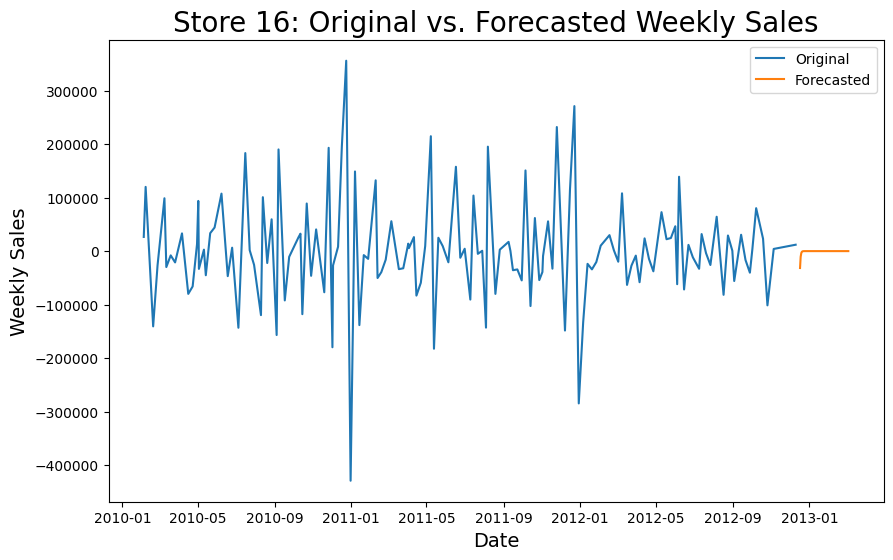

Store 17: Time series is stationary.


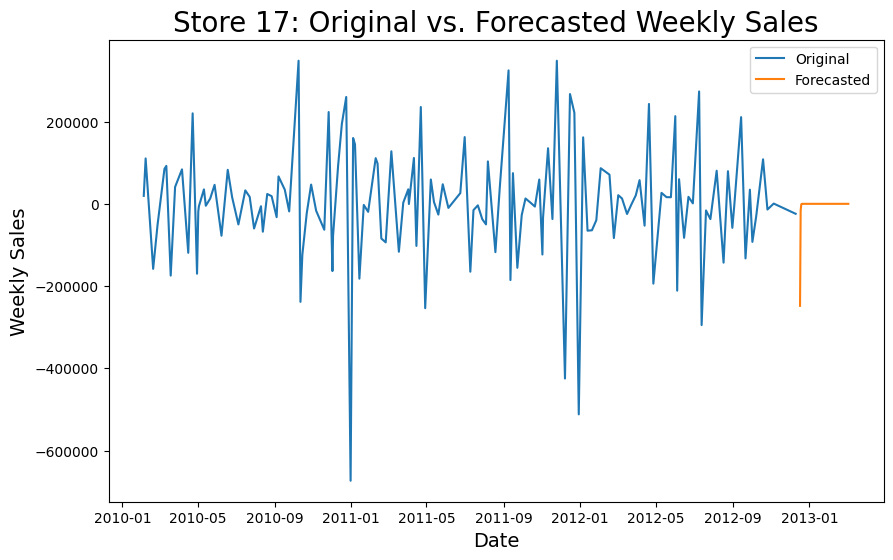

Store 18: Time series is stationary.


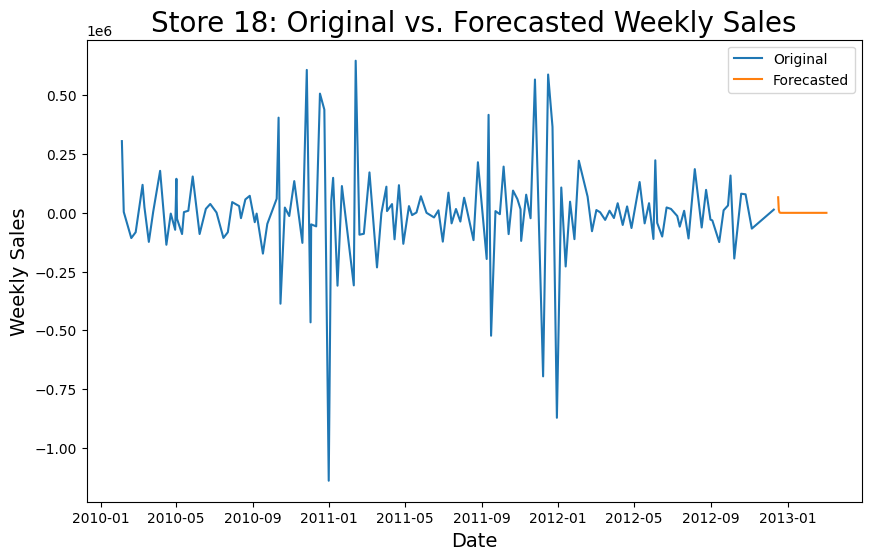

Store 19: Time series is stationary.


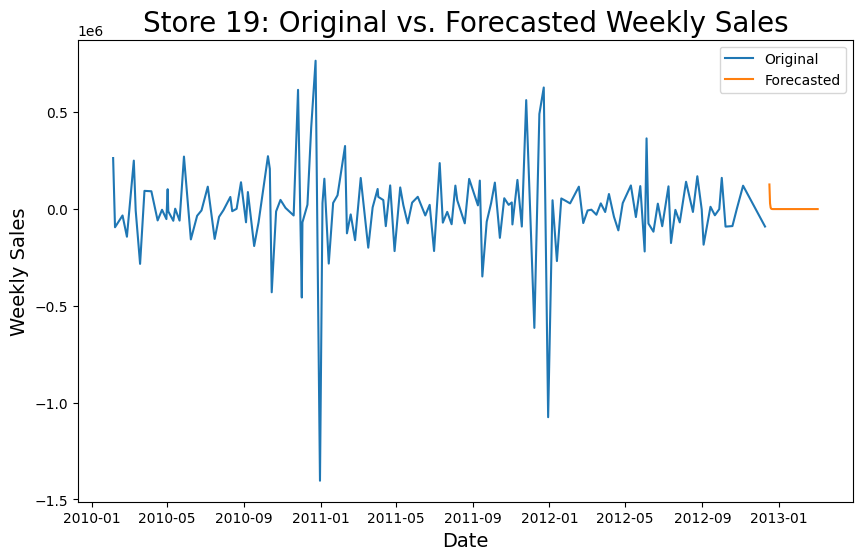

Store 20: Time series is stationary.


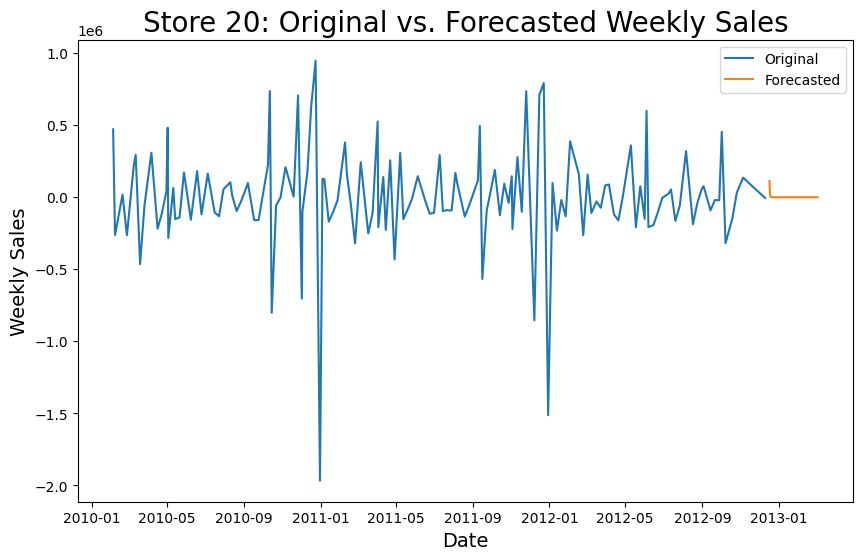

Store 21: Time series is stationary.


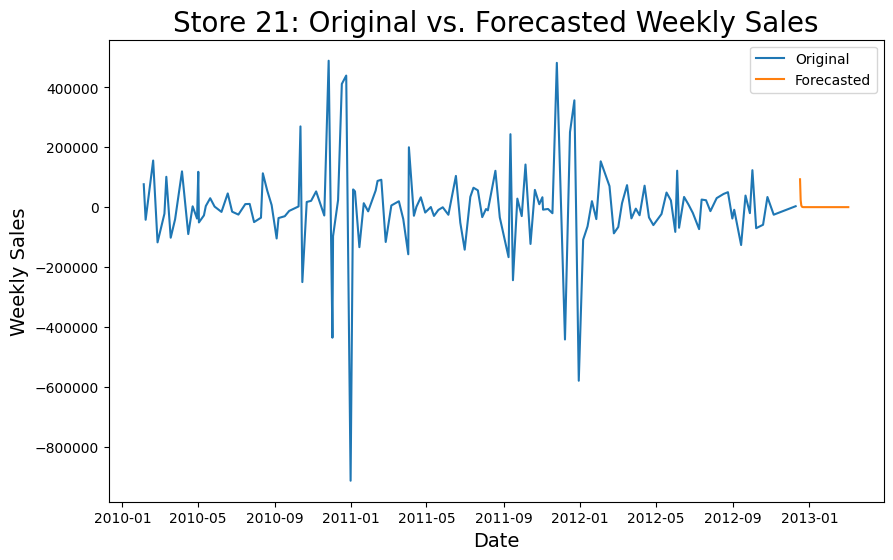

Store 22: Time series is stationary.


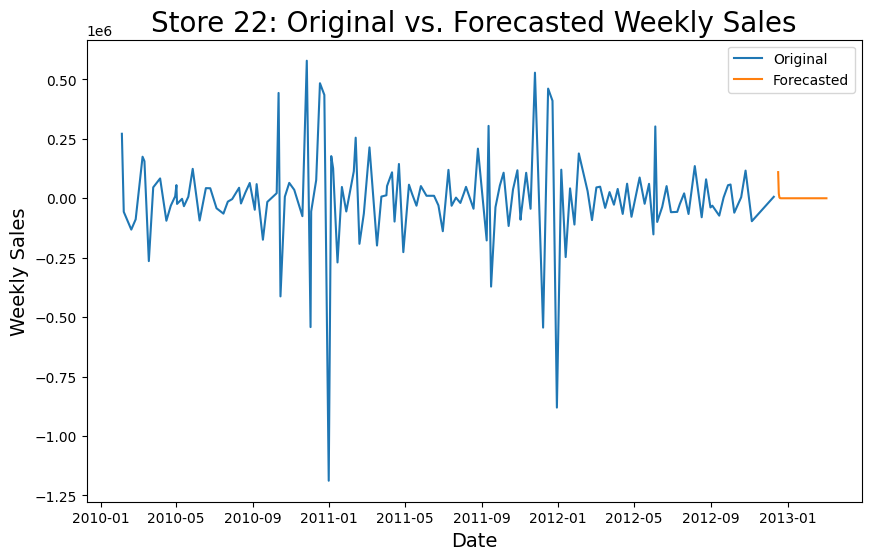

Store 23: Time series is stationary.


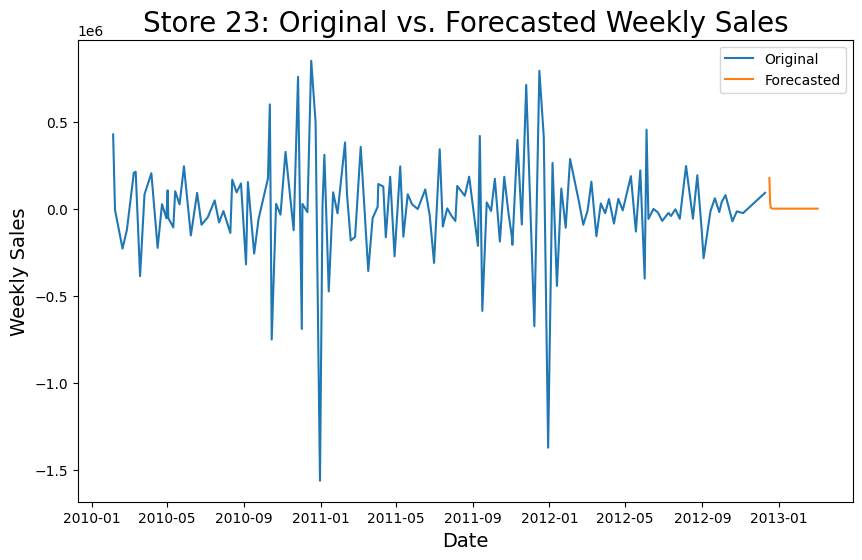

Store 24: Time series is stationary.


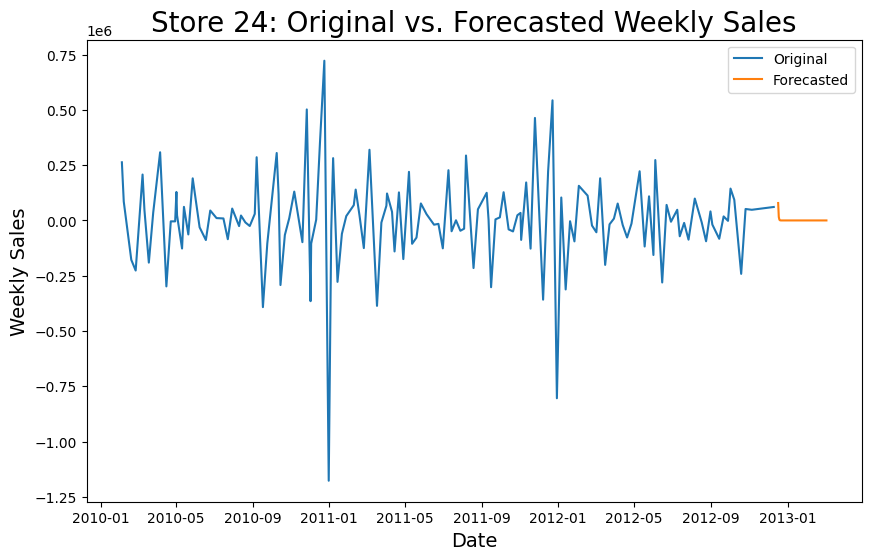

Store 25: Time series is stationary.


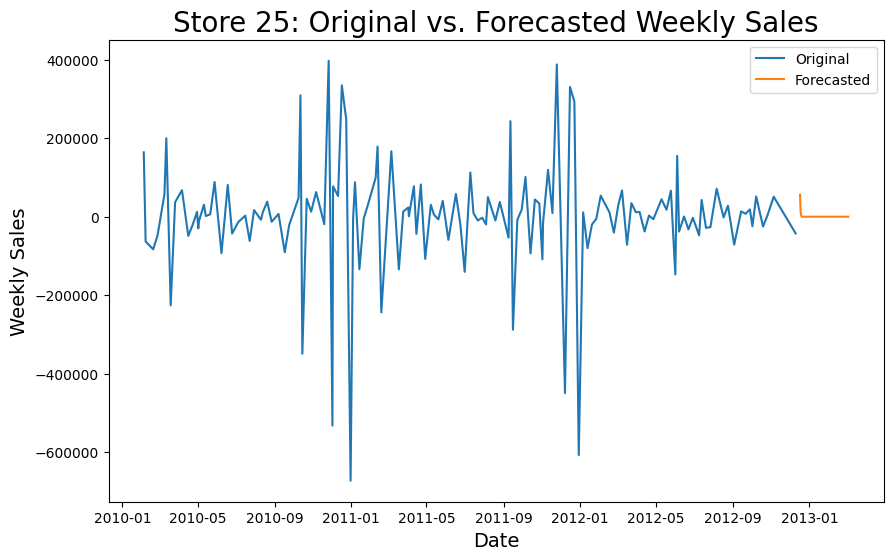

Store 26: Time series is stationary.


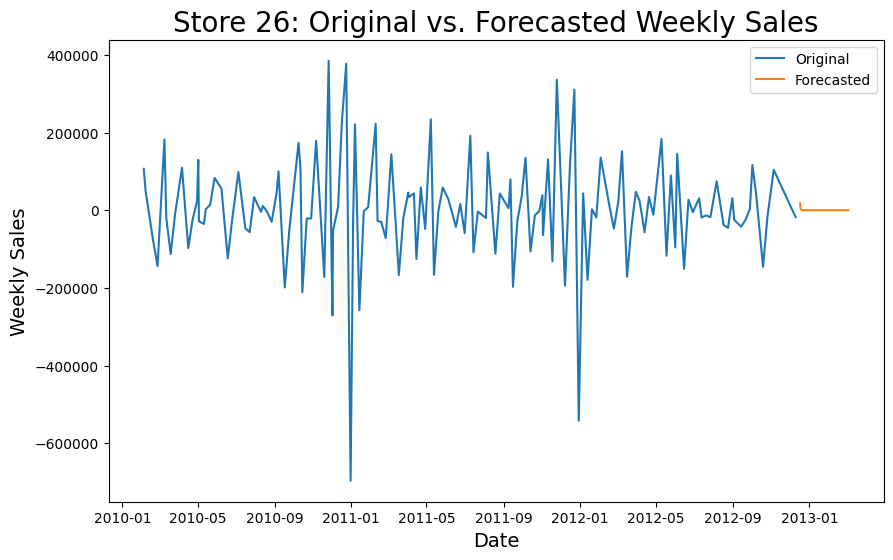

Store 27: Time series is stationary.


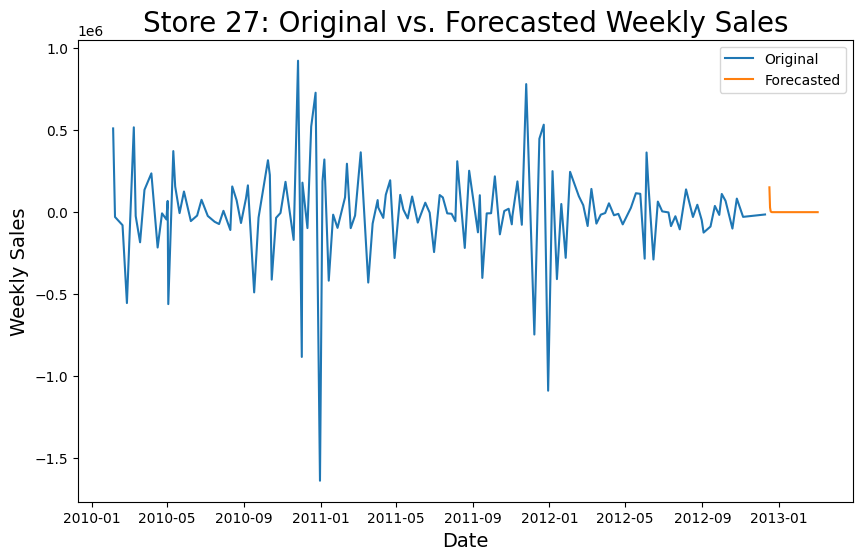

Store 28: Time series is stationary.


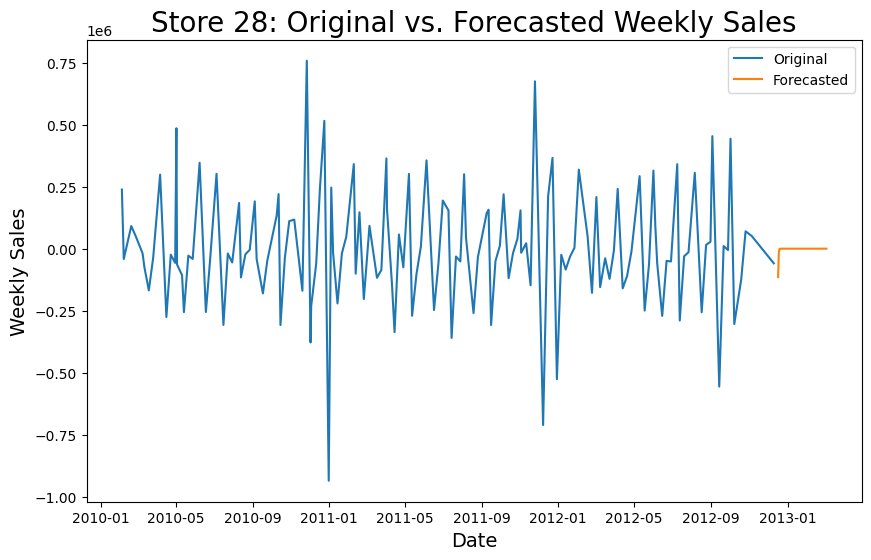

Store 29: Time series is stationary.


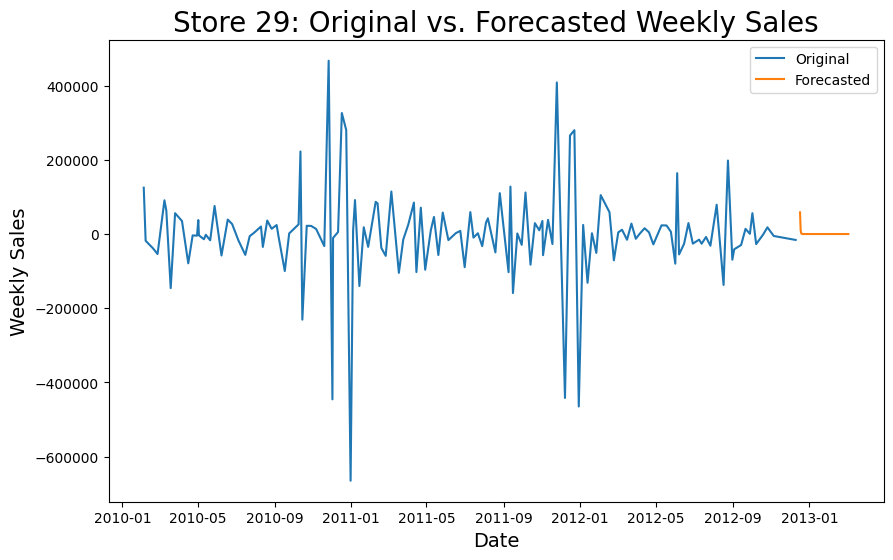

Store 30: Time series is stationary.


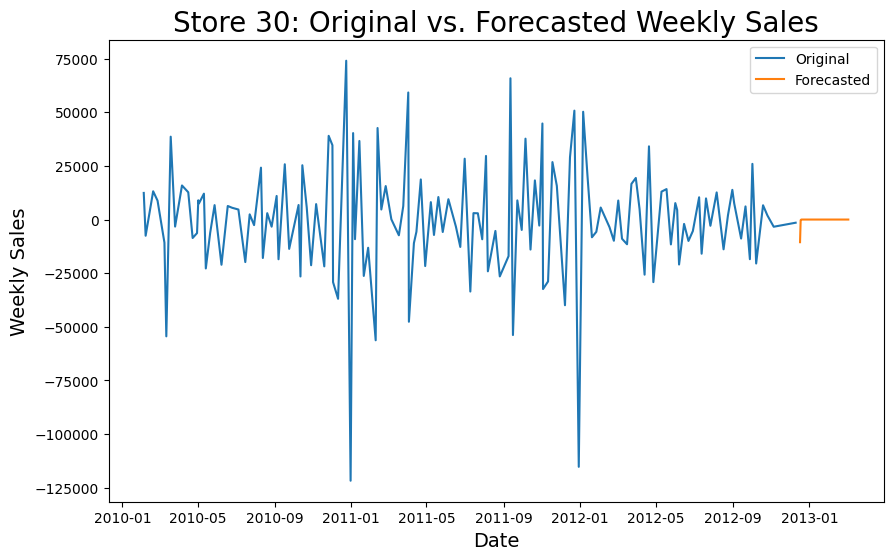

Store 31: Time series is stationary.


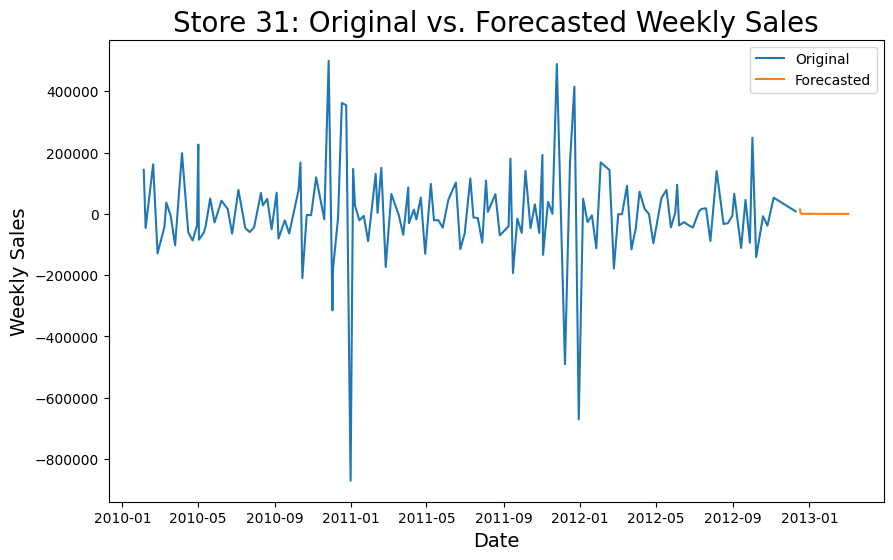

Store 32: Time series is stationary.


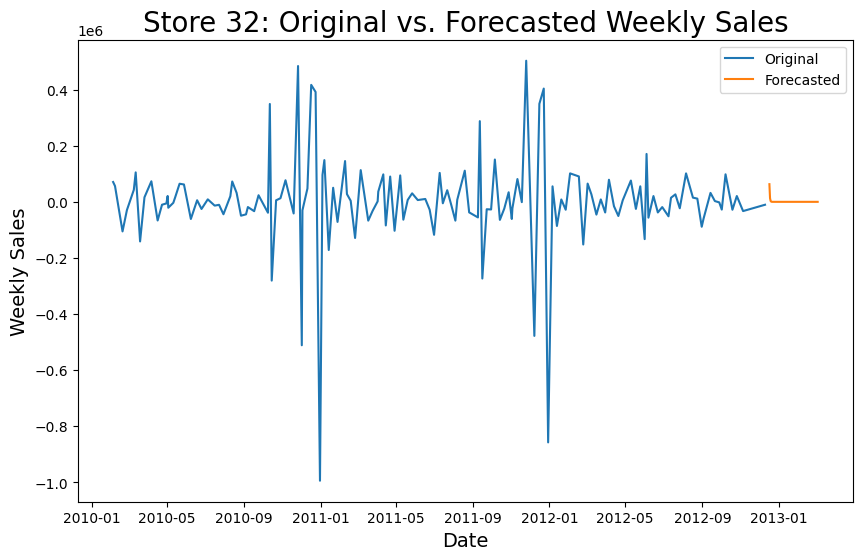

Store 33: Time series is stationary.


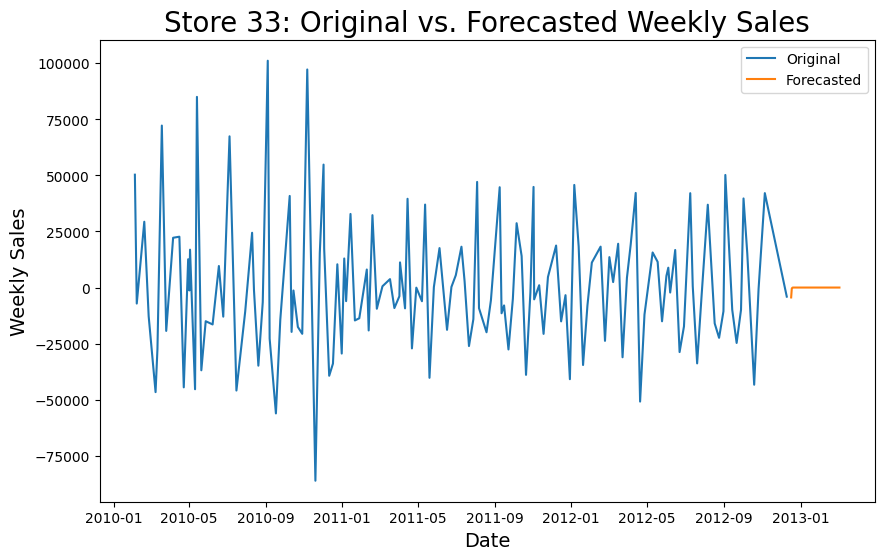

Store 34: Time series is stationary.


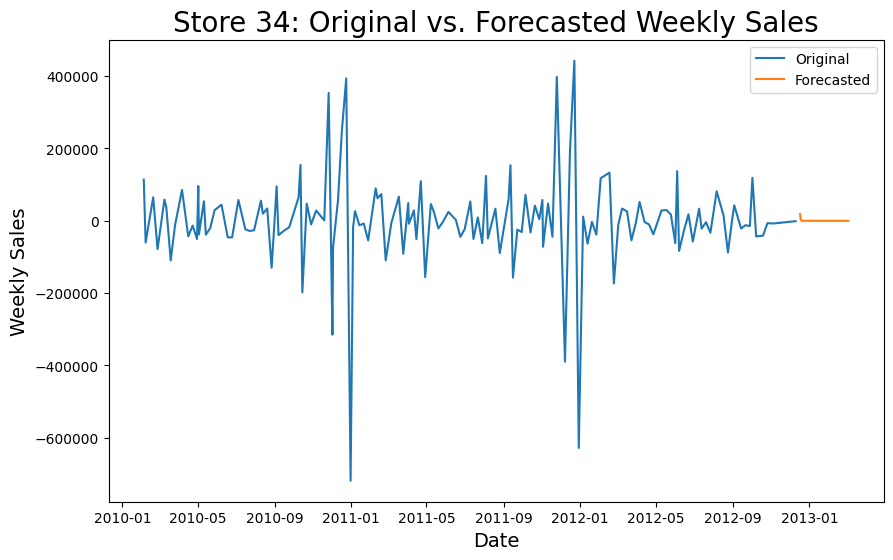

Store 35: Time series is stationary.


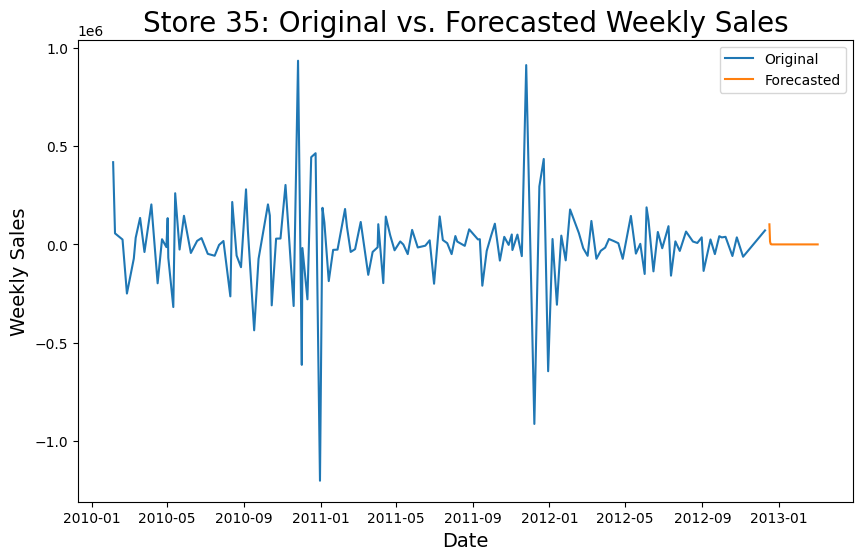

Store 36: Time series is stationary.


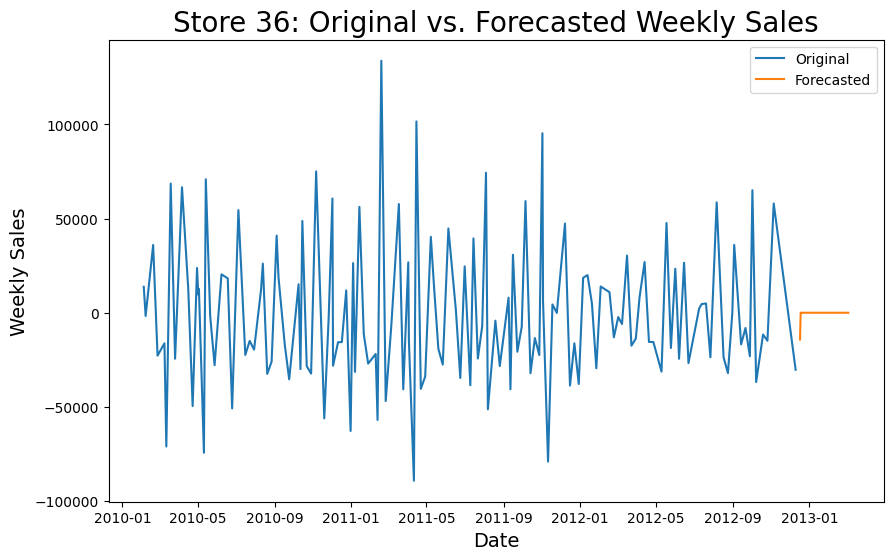

Store 37: Time series is stationary.


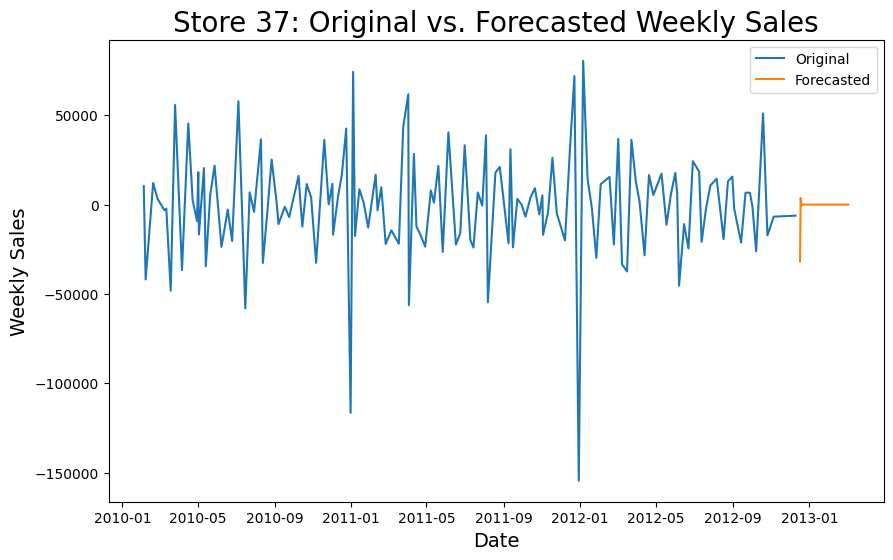

Store 38: Time series is stationary.


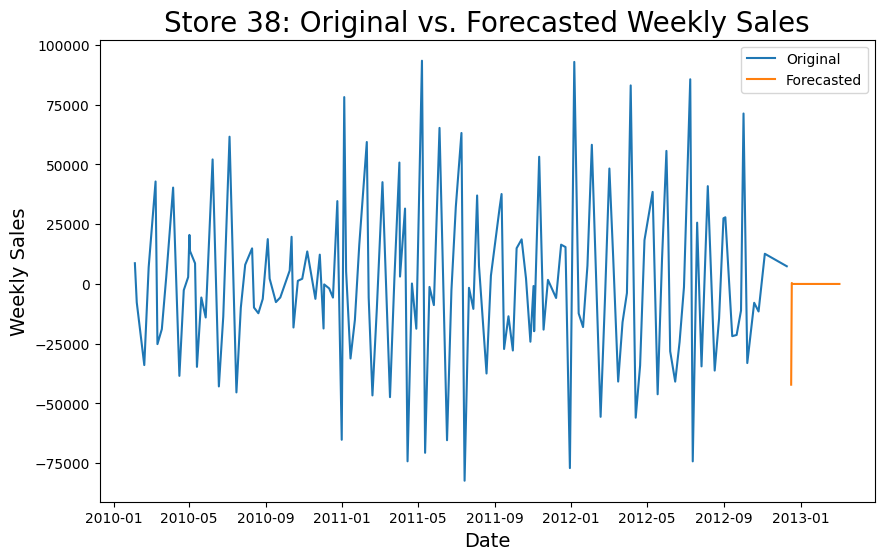

Store 39: Time series is stationary.


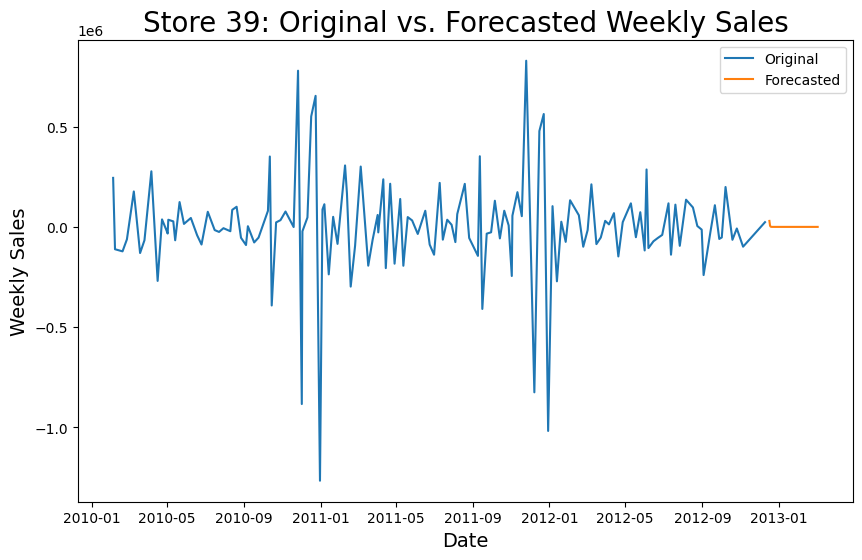

Store 40: Time series is stationary.


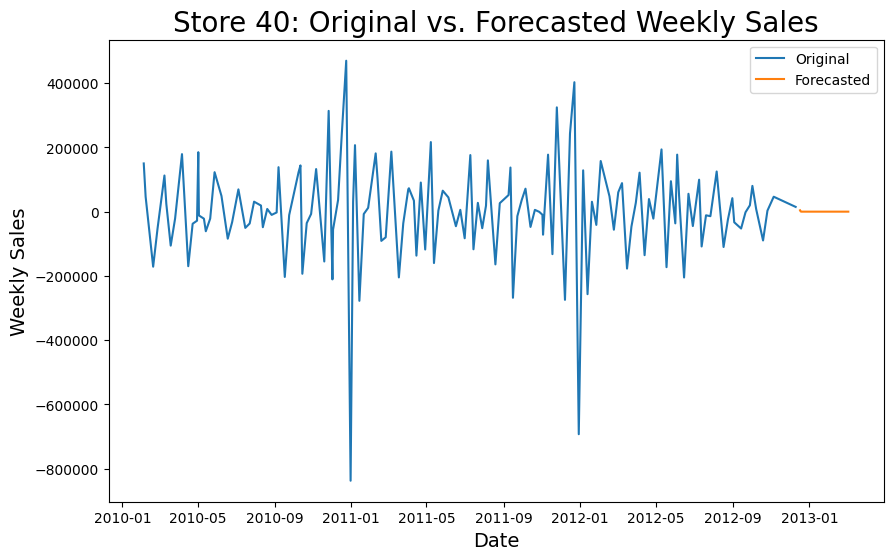

Store 41: Time series is stationary.


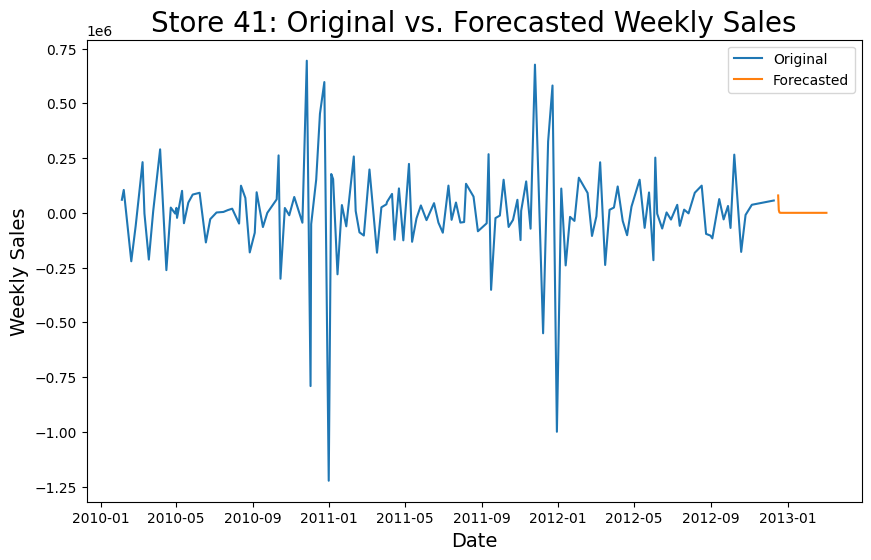

Store 42: Time series is stationary.


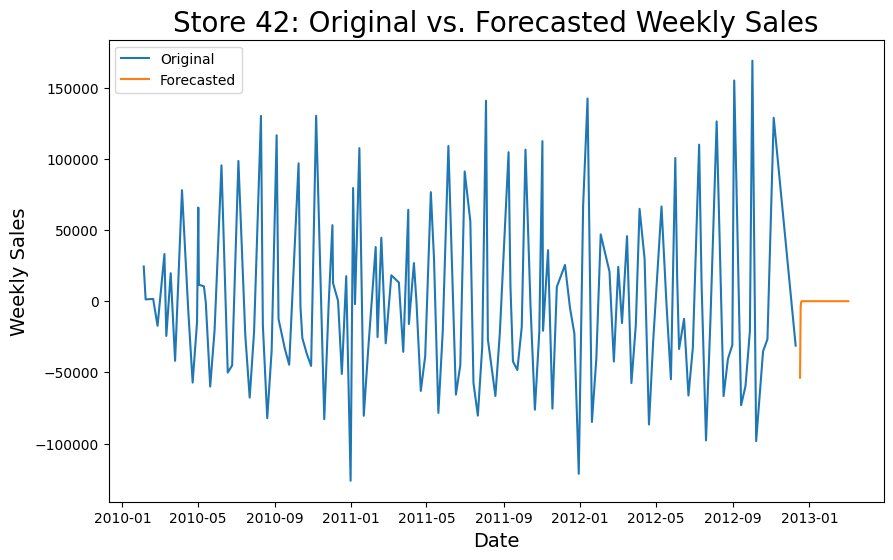

Store 43: Time series is stationary.


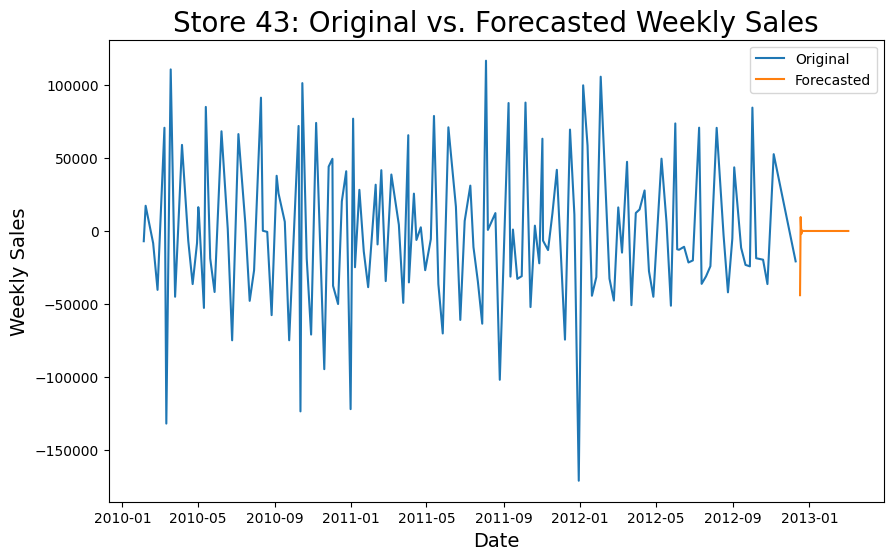

Store 44: Time series is stationary.


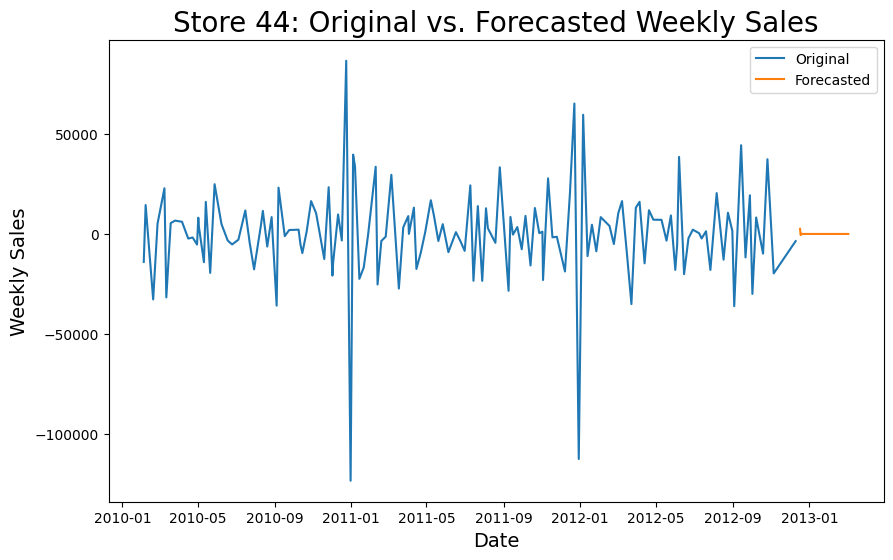

Store 45: Time series is stationary.


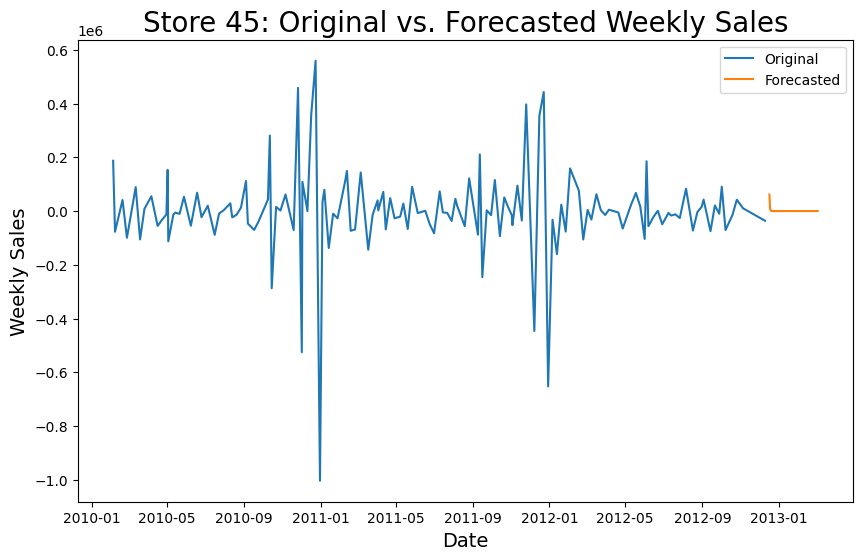

In [130]:
# Get a sorted list of unique store IDs
store_ids = sorted(df['Store'].unique())
def forecast_for_store(sales_data, store_id, num_weeks=12):
    # Preprocess the data
    # sales_data['Date'] = pd.to_datetime(sales_data['Date'], dayfirst=True)
    # sales_data.set_index('Date', inplace=True)
    sales_data['Weekly_Sales_Diff'] = sales_data['Weekly_Sales'] - sales_data['Weekly_Sales'].shift(1)

    result = adfuller(sales_data['Weekly_Sales_Diff'].dropna())
    if result[1] <= 0.05:
        print(f"Store {store_id}: Time series is stationary.")
    else:
        print(f"Store {store_id}: Time series is not stationary. You may need to difference again or apply other transformations.")


    # Train the SARIMAX model with customized order
    train = sales_data.iloc[:120]
    order = (1, 0, 1)  # Customize the order as needed
    model = SARIMAX(train['Weekly_Sales_Diff'], order=order)
    results = model.fit()

    # Forecast for the next 'num_weeks' weeks
    sales_data.index = pd.to_datetime(sales_data.index)
    forecast_start_date = sales_data.index[-1] + pd.DateOffset(weeks=1)  # Start from the next week
    forecast_end_date = forecast_start_date + pd.DateOffset(weeks=11)
    forecast_date_range = pd.date_range(forecast_start_date, forecast_end_date)
    forecast = results.predict(start=len(train), end=len(train) + len(forecast_date_range) - 1)

    # Create a DataFrame for the forecasted data with the appropriate date index
    forecast_df = pd.DataFrame({'Date': forecast_date_range, f'Weekly_Sales_Diff_Forecast_Store{store_id}': forecast})
    forecast_df.set_index('Date', inplace=True)

    # Plot the original and forecasted data
    plt.figure(figsize=(10, 6))
    plt.title(f'Store {store_id}: Original vs. Forecasted Weekly Sales', fontsize=20)
    plt.plot(sales_data['Weekly_Sales_Diff'], label='Original')
    plt.plot(forecast_df[f'Weekly_Sales_Diff_Forecast_Store{store_id}'], label='Forecasted')
    plt.legend(loc='best')
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Weekly Sales', fontsize=14)
    plt.show()

    # Return the forecasted data
    return forecast_df

# 'data' contains the data for all stores and 'Store' is the column with store IDs
for store_id in store_ids:
    sales_data = df[df['Store'] == store_id]
    forecast_for_store(sales_data, store_id)